# Notebook for analysing all VR trials of one experimental group from REINFORCEMENT TEST trials

## Assumes use of FlyOver version 9.4 or higher (closed-loop optogenetic stimulation possible)
## Data from multiple trials and flies is pooled and collected in a single data frame, which is then used for data visualisation and statistics.

In [339]:
__author__ = 'Hannah Haberkern, hjmhaberkern@gmail.com'

import numpy as np
import pandas as pd
    
from os import listdir, mkdir, walk
from os.path import isfile, sep
from sys import path, exit
from glob import glob

import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib import gridspec
import seaborn as sns

from Tkinter import Tk
from tkFileDialog import askdirectory, askopenfilename

path.insert(1, '/Users/hannah/Dropbox/code/flyVR/flyVRoptogenetics/')
from flyVRoptogenetics_oneTrialBasicAnalysis import singleVROptogenTrialAnalysis

path.insert(1, '/Users/hannah/Dropbox/code/plottingUtilities/')
from plottingUtilities import makeNestedPlotDirectory, myAxisTheme
from objectInteractionPlots import residencyWithHistograms_splitOnWalking, residencyWithHistograms,\
        radDistAngleCombiPlot, plotResidencyInMiniarena, make4ValuePolCoordPlot

path.insert(1, '/Users/hannah/Dropbox/code/trajectoryAnalysis/')
from trajectoryDerivedParams import relationToObject, cartesian2polar, polarCurvature
from plotsWithDataframe import plotVeloHeadingDistribution_flyVR_df, plotVeloHeadingDistribution2_flyVR_df,\
                               oneDimResidency_df, oneDimResidencyWithVar_df, turnRatePerDistance

path.insert(1, '/Users/hannah/Dropbox/code/flyVR/utilities/')
from loadSingleTrial import rZoneParamsFromLogFile

# Choose files to analyse ..............................................................................................

baseDir = '/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/'

root = Tk()
# prevents root window from appearing
root.withdraw()
# choose experiment folder
dataDir = askdirectory(initialdir=baseDir,
                       title='Select experiment directory (containing directories for multiple flies)') + sep
expDirs = sorted(walk(dataDir).next()[1])

analysisDir = sep.join(dataDir.split(sep)[:-2]) + sep + 'analysis' + sep

try:
    expDirs.remove('virtualWorld')
except:
    print('You selected an invalid data directory.\n' +
          'Expected folder structure of the selected path is some/path/to/experimentName/flyGender/rawData/')
    exit(1)

print('\n Analysing the following folders:\n')
print(expDirs)

rerunbasicanalysis = raw_input('Would you like to (re-)run the basic analysis on each file \n'
                               'instead of loading previously saved data? (y, n)\n')


 Analysing the following folders:

['m01', 'm02', 'm03', 'm04', 'm05', 'm06', 'm07', 'm08', 'm09', 'm10', 'm11', 'm12', 'm13', 'm14', 'm15', 'm16', 'm17', 'm18', 'm19', 'm20']
Would you like to (re-)run the basic analysis on each file 
instead of loading previously saved data? (y, n)
n


In [159]:
tmp = expDirs[:20]
tmp

['m01',
 'm02',
 'm03',
 'm04',
 'm05',
 'm06',
 'm07',
 'm08',
 'm09',
 'm10',
 'm11',
 'm12',
 'm13',
 'm14',
 'm15',
 'm16',
 'm17',
 'm18',
 'm19',
 'm20']

In [2]:
expDirs = expDirs[:20]

In [82]:
my_indices = [2,3,4,7,8,9,10,12,13,14,15,16,19,20]
expDirs = [expDirs[i] for i in my_indices]
expDirs

['m03',
 'm04',
 'm05',
 'm08',
 'm09',
 'm10',
 'm11',
 'm13',
 'm14',
 'm15',
 'm16',
 'm17',
 'm20',
 'm21']

### Compose mutli-fly data into dataframe

In [340]:
# generate fly color map
numFlies = len(expDirs)
cNorm  = colors.Normalize(vmin=0, vmax=numFlies)
flyCMap = plt.cm.ScalarMappable(norm=cNorm,cmap='Accent')

In [341]:
expDir = dataDir + expDirs[0] + sep
FODataFiles = [filepath.split(sep)[-1] for filepath in glob(expDir + '*.txt')]

In [342]:
keylist = ['curvature','gamma','gammaFull','headingAngle','objectDistance','rotVelo','time',
           'transVelo','xPos','xPosInMiniarena','yPos','yPosInMiniarena','rEvents']

keylistLong = ['flyID','trial','trialtype','reinforcement','moving'] + keylist
FOAllFlies_df = pd.DataFrame(data=np.zeros((0,len(keylistLong))), columns=keylistLong)

nTrialsVI = 0
nTrialsIN = 0
nTrialsR = 0
nTrialsNR = 0
 
vTransTH = 2 #mm/s

# Go through directories of experiments with different flies ...............................................
for currExpDir in expDirs:

    expDir = dataDir + currExpDir + sep
    print('\n Analysing the following folder:\n')
    print(expDir)

    FODataFiles = [filepath.split(sep)[-1] for filepath in glob(expDir + '*.txt')]
    FODataFiles = sorted(FODataFiles)

    print('\n Analysing the following log files:\n')
    print(FODataFiles)

    # Run single trial analysis on each file in folder .....................................................
    for fileToAnalyse in FODataFiles:
        
        flyID = fileToAnalyse.split('_')[4]
        genotype = fileToAnalyse.split('_')[3]
        trial = FODataFiles.index(fileToAnalyse) + 1
        
        if rerunbasicanalysis == 'y':
            returnVal = singleVROptogenTrialAnalysis(expDir + fileToAnalyse)
            print('Ran analysis, now loading saved *.npy file.')
            FODatLoad = np.load(expDir + fileToAnalyse[:-3] + 'npy')[()]
        else:
            print('Loading saved *.npy file.')
            FODatLoad = np.load(expDir + fileToAnalyse[:-3] + 'npy')[()]

        # Split into visible object trials and invisible object trials
        if 'Invisible' in fileToAnalyse or 'invisible' in fileToAnalyse:
            trialtype = 'invisible'
            nTrialsIN += 1
        else:
            trialtype = 'visible'
            nTrialsVI += 1
        
        if 'rZones' in fileToAnalyse:
            rZones = 'on'
            nTrialsR += 1
        else:
            rZones = 'off'
            nTrialsNR += 1
        
        vTrans = np.copy(FODatLoad['transVelo'])
        moving = vTrans >= vTransTH

        FODatLoad_df = pd.DataFrame.from_dict(FODatLoad,orient='columns')
        FODatLoad_df.insert(0, 'flyID', flyID)
        FODatLoad_df.insert(1, 'trial', trial)
        FODatLoad_df.insert(2, 'trialtype', trialtype)
        FODatLoad_df.insert(3, 'reinforcement', rZones)
        FODatLoad_df.insert(4, 'moving', moving)
        
        FOAllFlies_df = FOAllFlies_df.append(FODatLoad_df)
        
        # TODO: Add selection criteria, e.g. to only include trials from flies that were 
        # walking >40% of time and did not have a strong turn bias.
        


 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObjectOptogen/circularVHeatZones/lowContrastGround/HC-Gal4_x_20CsChrWTB_noRetinal/male/rawData/m01/

 Analysing the following log files:

['singleObjectForestLC_1cm4cmCone_12cmHex_HC-Gal4x20CsChrWTB_noRetinalm01_8d_none_out_160210193508.txt', 'singleObjectForestLC_1cm4cmCone_12cmHex_HC-Gal4x20CsChrWTB_noRetinalm01_8d_none_out_160210195819.txt', 'singleObjectForestLC_1cm4cmCone_12cmHex_HC-Gal4x20CsChrWTB_noRetinalm01_8d_rZones_out_160210194700.txt', 'singleObjectForestLC_1cm4cmInvisibleCone_12cmHex_HC-Gal4x20CsChrWTB_noRetinalm01_8d_rZones_out_160210192025.txt']
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.

 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/singleObjectOptogen/circularVHeatZones/lowContrastGround/HC-Gal4_x_20CsChrWTB_noRetinal/male/rawData/m02/

 Analysing the following log 

In [343]:
FOAllFlies_df = FOAllFlies_df[keylistLong]

FOAllFlies_df['flyID'] = FOAllFlies_df['flyID'].astype('category')
FOAllFlies_df['trial'] = FOAllFlies_df['trial'].astype('category')
FOAllFlies_df['trialtype'] = FOAllFlies_df['trialtype'].astype('category')
FOAllFlies_df['reinforcement'] = FOAllFlies_df['reinforcement'].astype('category')

FOAllFlies_df 

,flyID,trial,trialtype,reinforcement,moving,curvature,gamma,gammaFull,headingAngle,objectDistance,rotVelo,time,transVelo,xPos,xPosInMiniarena,yPos,yPosInMiniarena,rEvents
0,noRetinalm01,1,visible,off,0,NaN,NaN,NaN,-0.000004,NaN,0.295869,0.000000,0.790624,60.622000,NaN,35.000000,NaN,0
1,noRetinalm01,1,visible,off,1,NaN,NaN,NaN,0.014791,NaN,0.177475,0.050004,3.160431,60.652297,NaN,35.025398,NaN,0
2,noRetinalm01,1,visible,off,1,NaN,NaN,NaN,0.023665,NaN,1.005696,0.100009,5.459482,60.773095,NaN,35.127296,NaN,0
3,noRetinalm01,1,visible,off,1,NaN,NaN,NaN,0.073955,NaN,1.064854,0.150013,6.321348,60.948493,NaN,35.336493,NaN,0
4,noRetinalm01,1,visible,off,1,NaN,NaN,NaN,0.127202,NaN,-0.118319,0.200018,4.962750,61.215689,NaN,35.167607,NaN,0
5,noRetinalm01,1,visible,off,1,NaN,NaN,NaN,0.121286,NaN,-2.188863,0.250022,8.682618,61.444486,NaN,35.071509,NaN,0
6,noRetinalm01,1,visible,off,1,NaN,NaN,NaN,0.011833,NaN,-3.194560,0.300026,9.044588,61.794954,NaN,34.815238,NaN,0
7,noRetinalm01,1,visible,off,1,NaN,NaN,NaN,-0.147909,NaN,-2.839617,0.350031,8.064651,62.139629,NaN,34.522413,NaN,0
8,noRetinalm01,1,visible,off,1,NaN,NaN,NaN,-0.289903,NaN,-2.070546,0.400035,8.118296,62.503247,NaN,34.348035,NaN,0
9,noRetinalm01,1,visible,off,1,NaN,NaN,NaN,-0.393439,NaN,-1.242321,0.450040,8.659251,62.847344,NaN,34.132645,NaN,0


In [344]:
keyind_xPos = keylistLong.index('xPosInMiniarena')
keyind_yPos = keylistLong.index('yPosInMiniarena')
keyind_mov = keylistLong.index('moving')
keyind_gam = keylistLong.index('gamma')
keyind_gamful = keylistLong.index('gammaFull')
keyind_fly = keylistLong.index('flyID')
keyind_vT = keylistLong.index('transVelo')
keyind_ang = keylistLong.index('headingAngle')
keyind_t = keylistLong.index('time')
keyind_vR = keylistLong.index('rotVelo')
keyind_objD = keylistLong.index('objectDistance')
keyind_event = keylistLong.index('rEvents')

flyIDallarray = np.asarray(FOAllFlies_df.iloc[:,keyind_fly:keyind_fly+1]).squeeze()
flyIDs = sorted(list(set(flyIDallarray.tolist())))

### Define structure of trials in terms of closed-loop optogenetic stimulation and presence of landmark cues

In [345]:
# Reinforcement test
rZoneState = ['off','off','on','on']
visibilityState = ['visible','visible','visible','invisible']
groundPlane = ['textured']
trialOrder = [0,2,1,3]
trialName = ['obj (1)','obj (3)','obj + opt (2)','opt (4)']
arenaRad = 60

rZone_rInner, rZone_rOuter, rZone_max, rZone_bl, rZone_gExp = rZoneParamsFromLogFile(expDir, fileToAnalyse)

In [346]:
%matplotlib inline 

### Select subset of flies based on walking activity

In [ ]:
for fly in range(numFlies):
    querystring = '(flyID == "'+ flyIDs[fly] +  '")'
    perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')

    percentMoving = (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving))

    if percentMoving >= 25.0:
        #print(percentMoving)
        print(flyIDs[fly]) 

In [ ]:
trial = 0
for fly in range(numFlies):
            
    querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'
    perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')

    percentMoving = (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving))

    if percentMoving >= 25.0:
        print(flyIDs[fly] + ' trial '+ str(trial+1))        

In [ ]:
# Select flies, then reassamble data frame

#expDirs = expDirs[:20]
my_indices = [0,2,3,4,5,6,8,9,10,11,12,13,15,16,18,19]
expDirs = [expDirs[i] for i in my_indices]
expDirs

### Trajectory plots of all trials

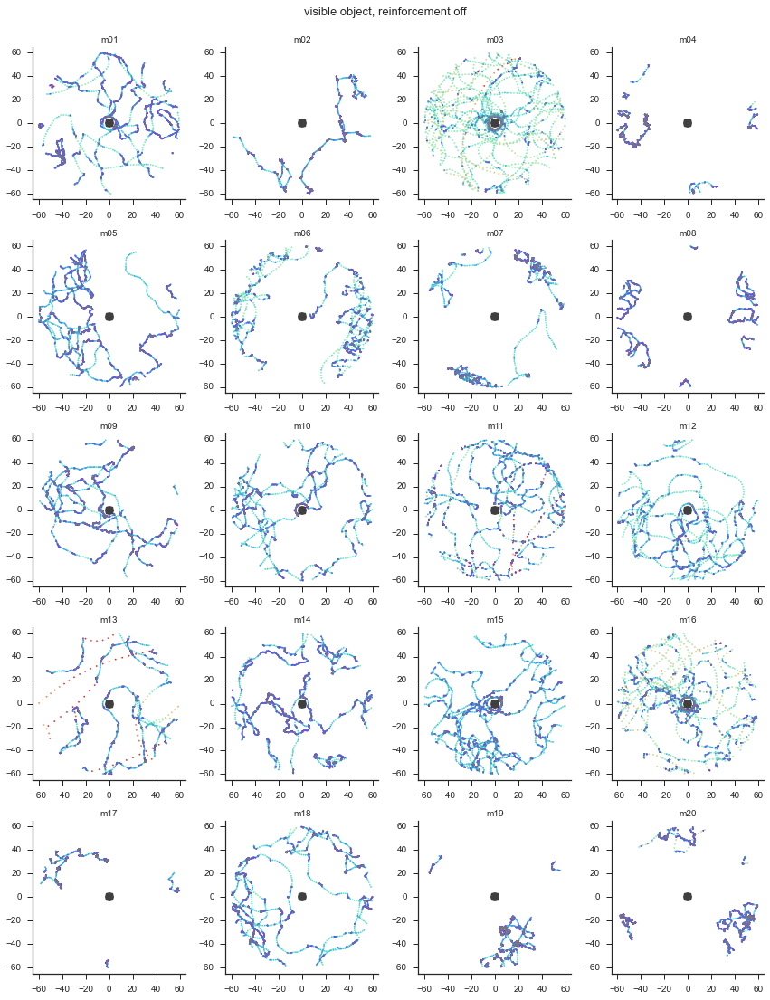

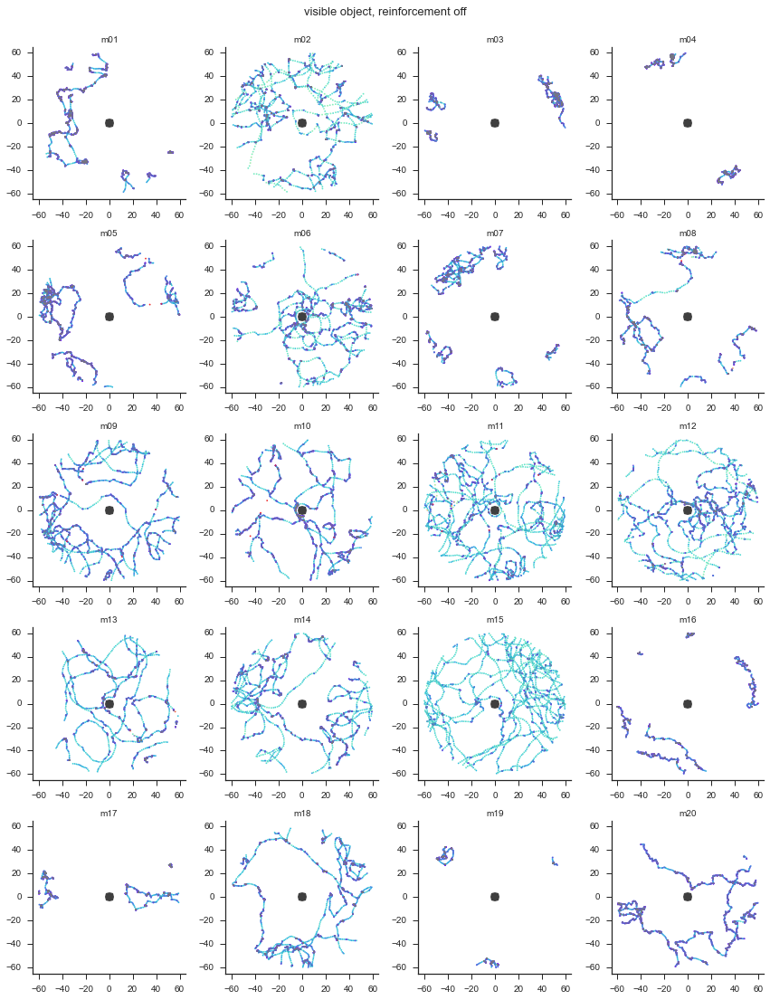

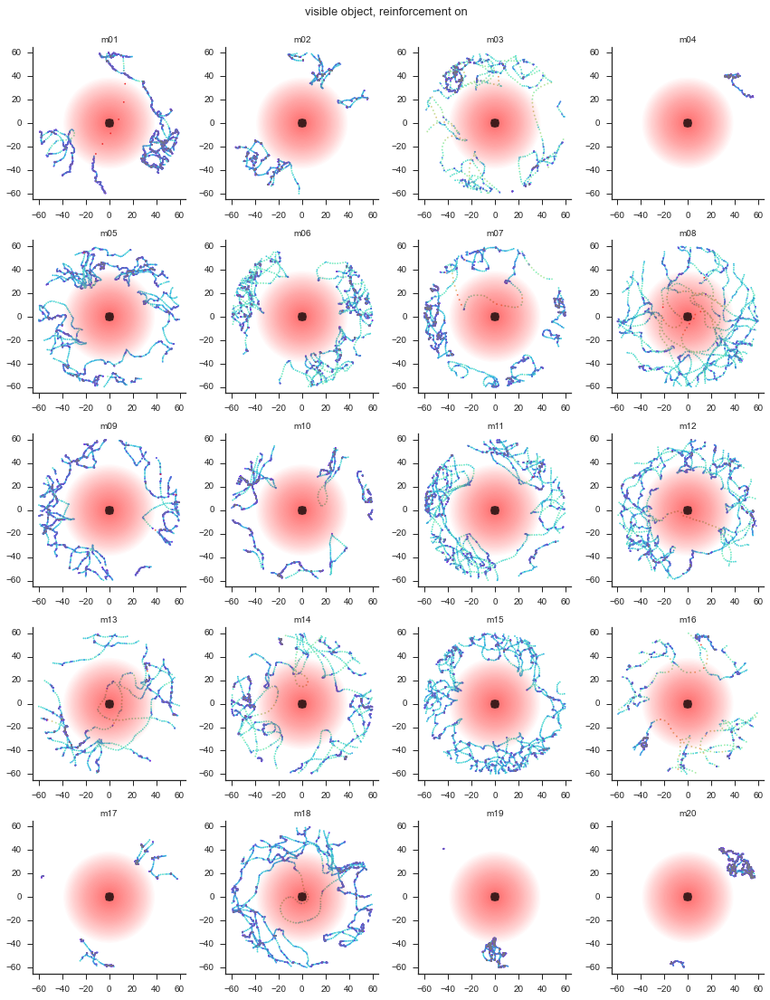

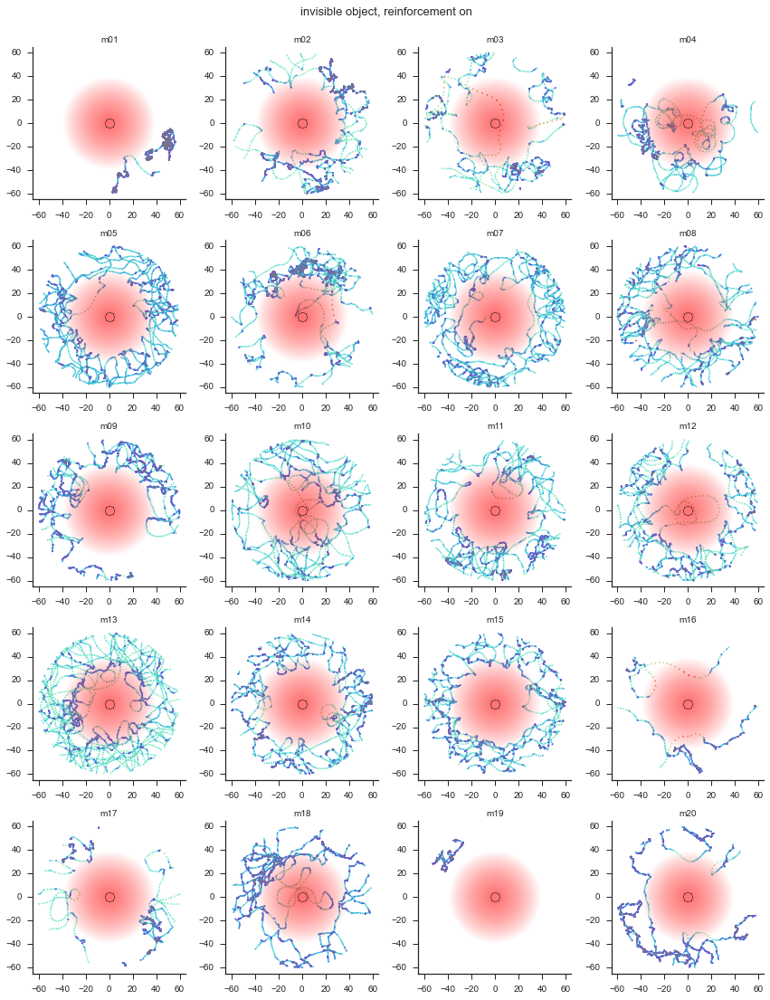

In [171]:
nrows = np.ceil(numFlies/4.0)
for ttind,trialtype in enumerate(visibilityState):
    multiflyTracePlot = plt.figure(figsize=(12,3*nrows))
    figtitle = multiflyTracePlot.suptitle(trialtype + ' object, reinforcement ' + rZoneState[ttind] ,fontsize=13,y=1.02)
    for fly in range(numFlies):
        multiflyTracePlot_sbplt = multiflyTracePlot.add_subplot(nrows,4,fly+1)
       
        querystring = '(trialtype=="' + trialtype + '") & (trial==' + str(ttind+1) + ') & (flyID =="' + flyIDs[fly] +  '")'

        perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze()
        perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze()
        perFlyvT = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze()
        
        selectPts = range(0,len(perFlyX),3)
        #color = scalarMap.to_rgba(timecolor), alpha = 0.1)
        multiflyTracePlot_sbplt.plot(perFlyX[selectPts],perFlyY[selectPts],'.',markersize=3,color='grey',alpha=0.2)
        multiflyTracePlot_sbplt.scatter(perFlyX[selectPts],perFlyY[selectPts],s=3, c=perFlyvT[selectPts], cmap='rainbow',
                                        vmin=-1, vmax=35, edgecolor='none',alpha=0.9)
        
        if (trialtype == 'visible'):
            multiflyTracePlot_sbplt.plot(0, 0, marker='o', markersize=10, linestyle='none', alpha=0.75, color='black')
        else:
            multiflyTracePlot_sbplt.plot(0, 0, marker='o', markersize=10, alpha=0.75, markeredgewidth=0.5,
                                         markerfacecolor='None',markeredgecolor='black')

        if(rZoneState[ttind]=='on'):
            rZoneRange = float(rZone_rOuter - rZone_rInner)
            for zRad in range(rZone_rInner, rZone_rOuter):
                circle1 = plt.Circle((0, 0), zRad, color='r', alpha=1.0/rZoneRange)
                multiflyTracePlot_sbplt.add_artist(circle1)
        
        myAxisTheme(multiflyTracePlot_sbplt)
        multiflyTracePlot_sbplt.set_title(flyIDs[fly],fontsize=10)
        multiflyTracePlot_sbplt.set_aspect('equal')
        multiflyTracePlot_sbplt.set_xlim(-arenaRad-5, arenaRad + 5)
        multiflyTracePlot_sbplt.set_ylim(-arenaRad-5, arenaRad + 5)
        
    multiflyTracePlot.tight_layout()
    
    # analysisDir + 'tracePlotMA/' should already exist from single trial analysis
    # makeNestedPlotDirectory(analysisDir, 'tracePlotMA/', objecttype + sep)
    multiflyTracePlot.savefig(analysisDir +'tracePlotMA/'+ genotype +'_'+flyIDs[0][0] +'_'+ trialtype +'_rZones'+ rZoneState[ttind]
                              +'_traceVeloColored_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf', format='pdf', 
                              bbox_extra_artists=(figtitle,), bbox_inches='tight')

### Velocity and relative heading distributions

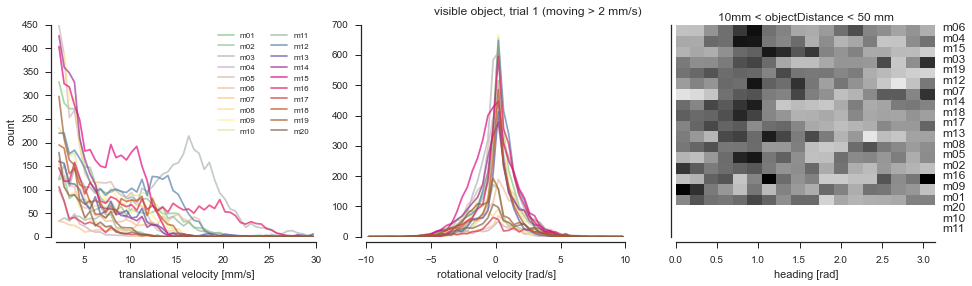

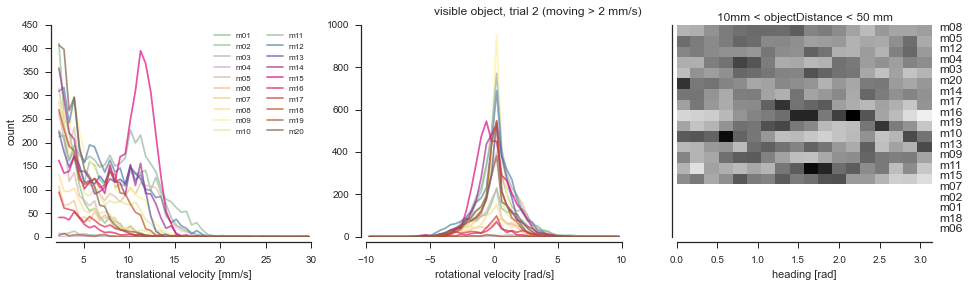

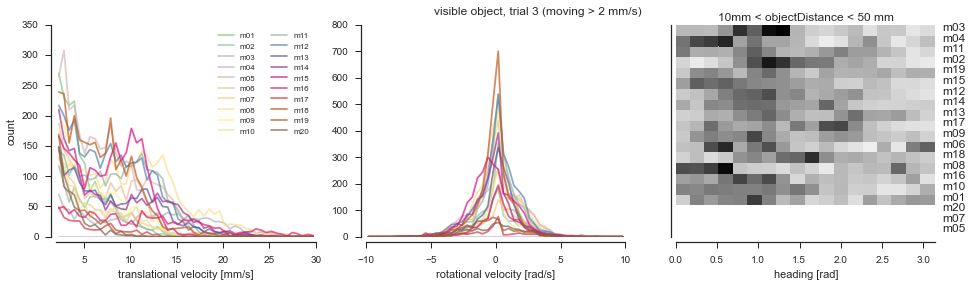

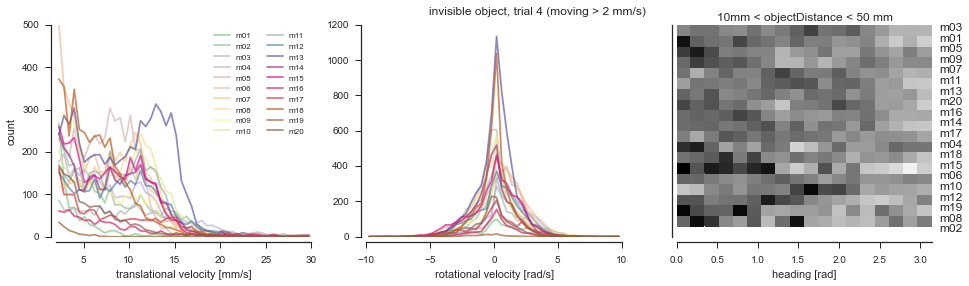

In [172]:
for ttind,trialtype in enumerate(visibilityState):
    
    veloDistFig = plotVeloHeadingDistribution_flyVR_df(FOAllFlies_df, trialtype, str(ttind+1), flyIDs, keylistLong,
                                                       vTransTH, 10, 50)
    veloDistFig.tight_layout()
    
    veloDistFig.savefig(analysisDir + 'velocityTraces/'+ genotype +'_'+flyIDs[0][0]+ '_' + trialtype + '_rZones' + rZoneState[ttind]
                + '_veloDistributions_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

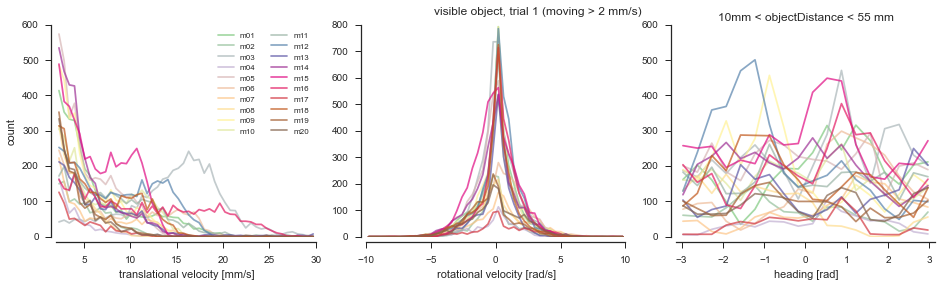

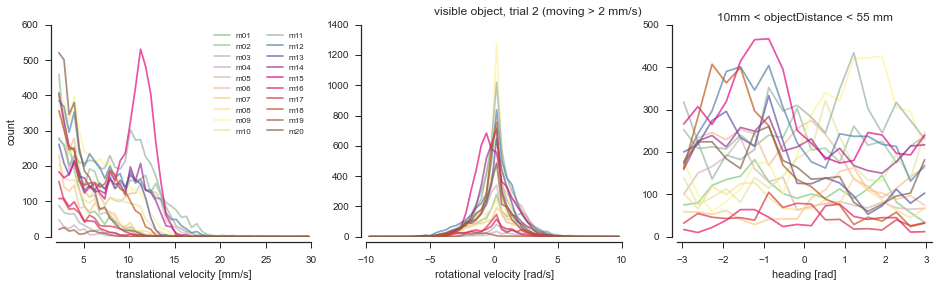

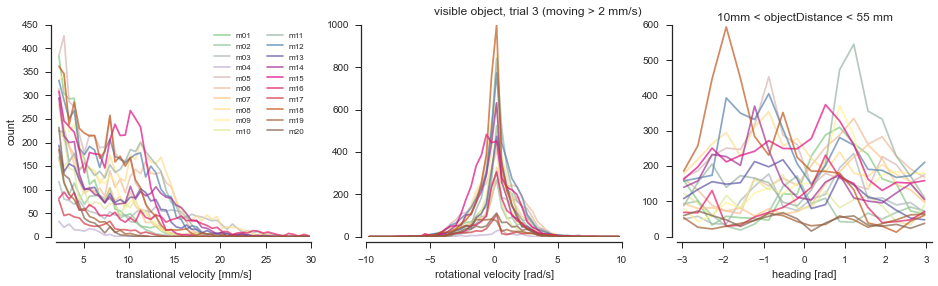

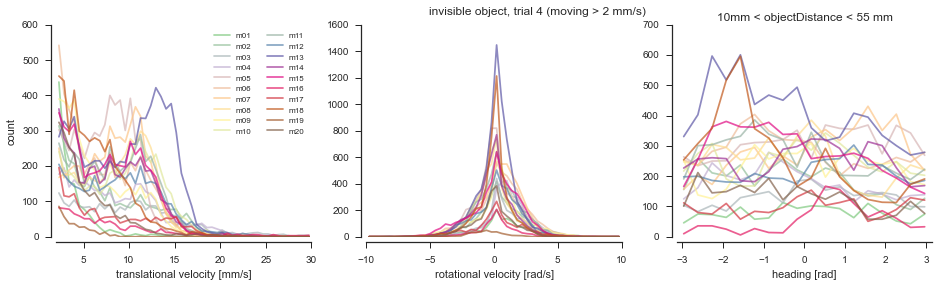

In [173]:
for ttind,trialtype in enumerate(visibilityState):
    veloDistFig = plotVeloHeadingDistribution2_flyVR_df(FOAllFlies_df,'all',trialtype, str(ttind+1), flyIDs, keylistLong,
                                                        vTransTH,10,55)
    veloDistFig.tight_layout()

    veloDistFig.savefig(analysisDir + 'velocityTraces/'+ genotype +'_'+flyIDs[0][0]+ '_' + trialtype + '_rZones' + rZoneState[ttind]
                + '_veloDistributions2_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

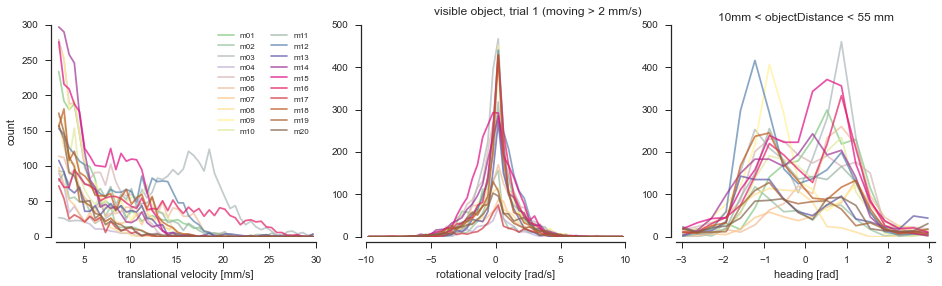

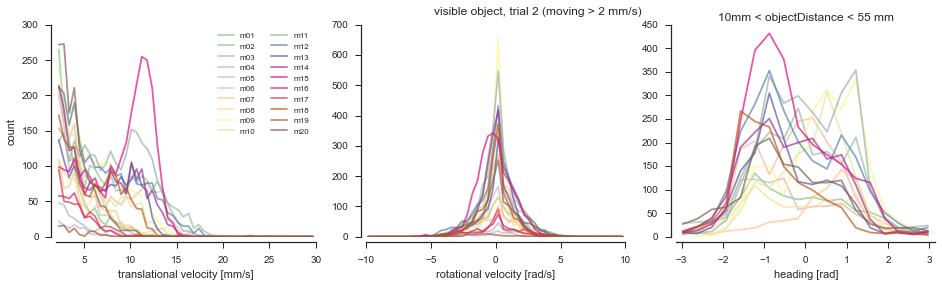

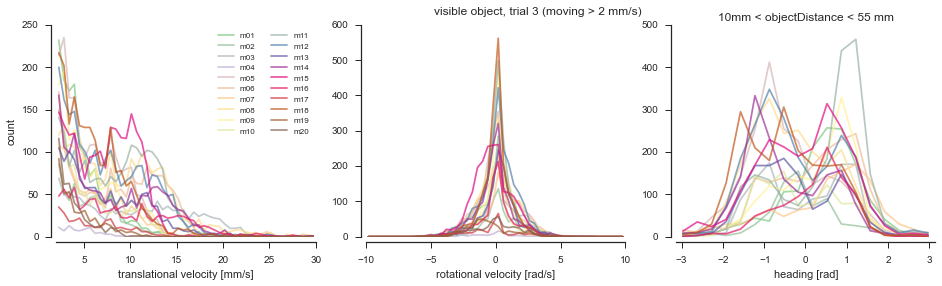

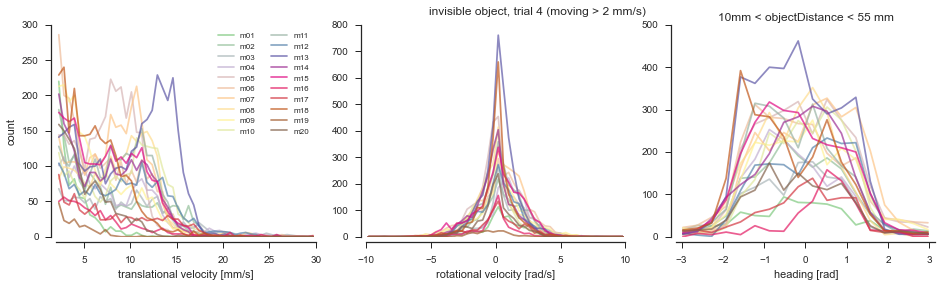

In [174]:
for ttind,trialtype in enumerate(visibilityState):
    veloDistFig = plotVeloHeadingDistribution2_flyVR_df(FOAllFlies_df, 'approach',trialtype, str(ttind+1), flyIDs, keylistLong,
                                                        vTransTH,10,55)
    veloDistFig.tight_layout()

    veloDistFig.savefig(analysisDir + 'velocityTraces/'+ genotype +'_'+flyIDs[0][0]+ '_' + trialtype + '_rZones' + rZoneState[ttind]
                + '_veloDistributions2_apr_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

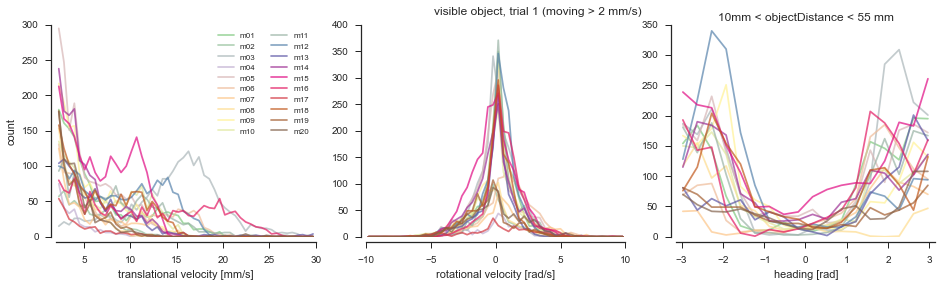

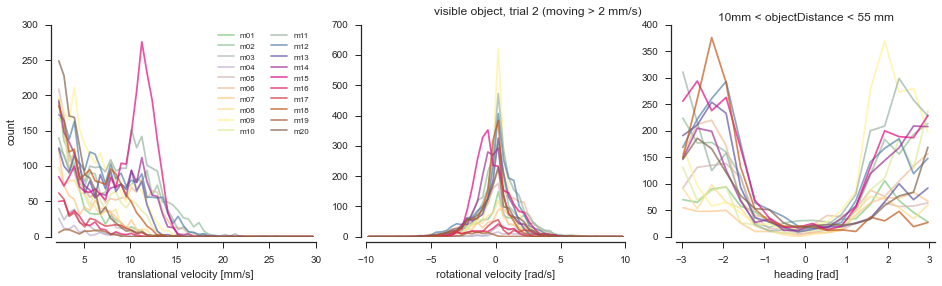

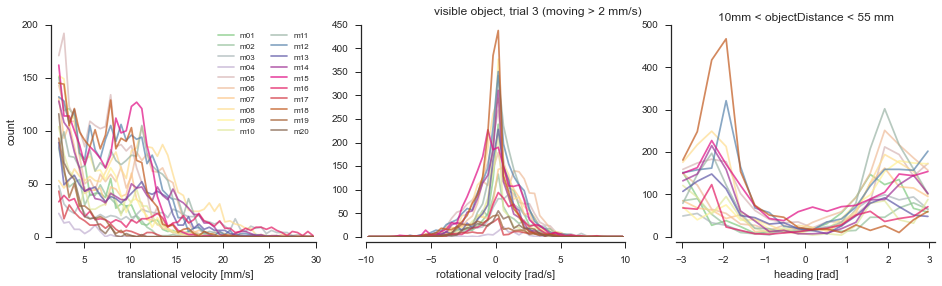

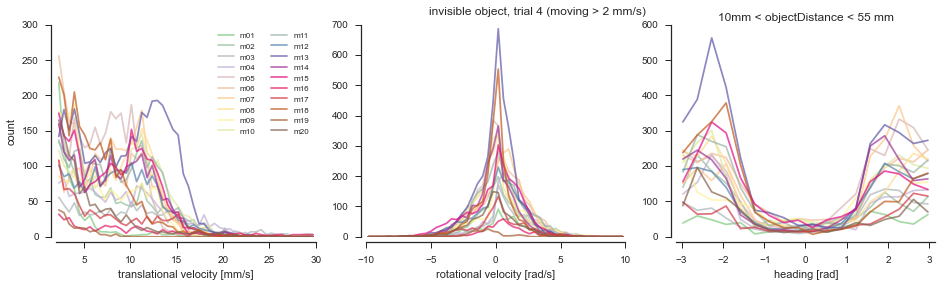

In [175]:
for ttind,trialtype in enumerate(visibilityState):
    veloDistFig = plotVeloHeadingDistribution2_flyVR_df(FOAllFlies_df, 'departure',trialtype, str(ttind+1), flyIDs, keylistLong,
                                                        vTransTH,10,55)
    veloDistFig.tight_layout()

    veloDistFig.savefig(analysisDir + 'velocityTraces/'+ genotype +'_'+flyIDs[0][0]+ '_' + trialtype + '_rZones' + rZoneState[ttind]
                + '_veloDistributions2_dep_trial' + str(ttind+1) + '_n'+ str(len(flyIDs)) + '.pdf', format='pdf')

## Residency

### 2D (cartesian) residency

Plot directory already exists


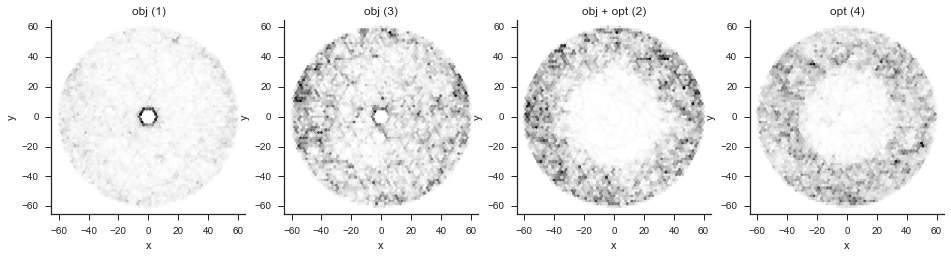

In [176]:
numBins = 60

keyind_xPos = keylistLong.index('xPosInMiniarena')
keyind_yPos = keylistLong.index('yPosInMiniarena')
keyind_mov = keylistLong.index('moving')
keyind_vT = keylistLong.index('transVelo')

hexplotfig = plt.figure(figsize=(16,4))
for trial, condition in enumerate(trialName):
    querystring = '(trial == ' + str(trial+1) + ') & (moving > 0)'
    xPosMA = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMA = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    ax = hexplotfig.add_subplot(1,4,trial+1)
    ax.hexbin(xPosMA, yPosMA, gridsize=numBins, cmap='Greys')
    plt.xlabel('x'); plt.ylabel('y')
    ax.set_xlim(-arenaRad-5, arenaRad+5); ax.set_ylim(-arenaRad-5, arenaRad+5)
    ax.set_title(trialName[trial])
    ax.set_aspect('equal')
    myAxisTheme(ax)

try:
    mkdir(analysisDir + 'residencyPlots/')
except:
    print('Plot directory already exists')
hexplotfig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                   +'_residencyMA_n'+ str(len(flyIDs)) +'.pdf', format='pdf')


Plot directory already exists
Plot directory already exists
Plot directory already exists
Condition was not tested.


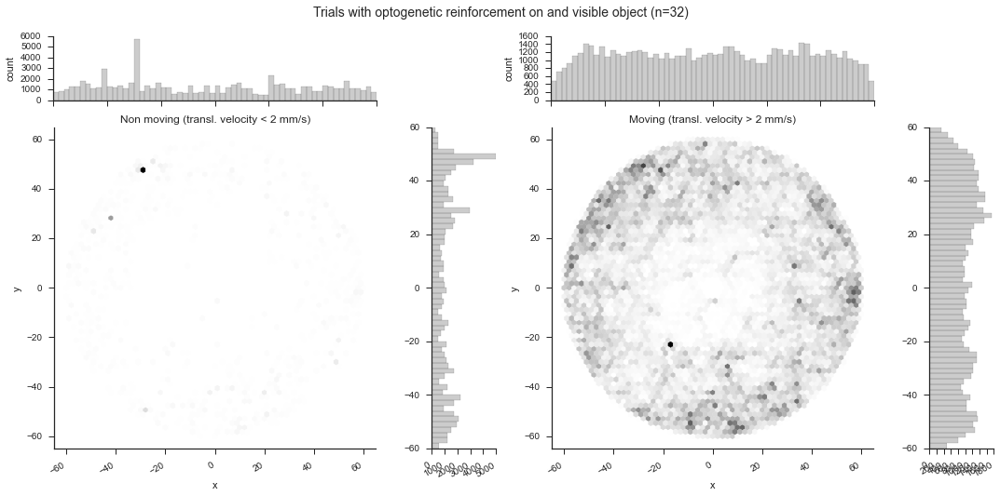

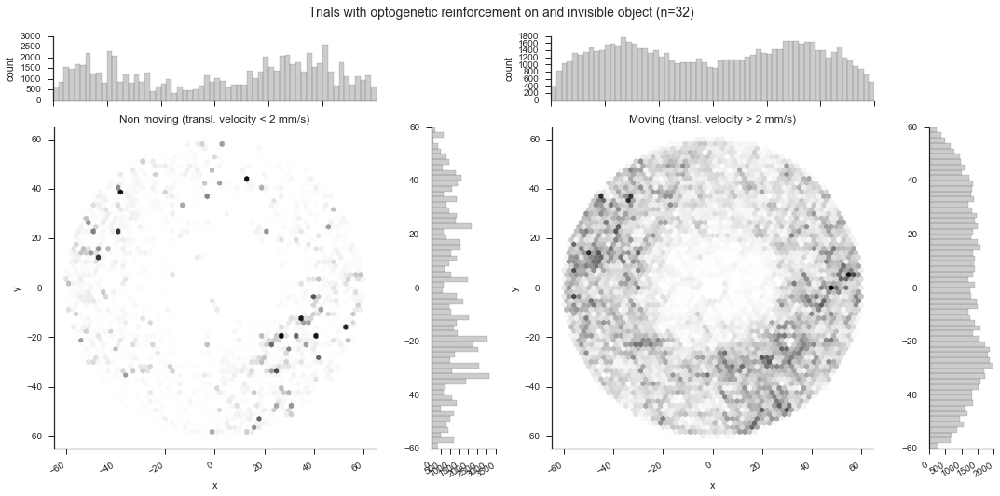

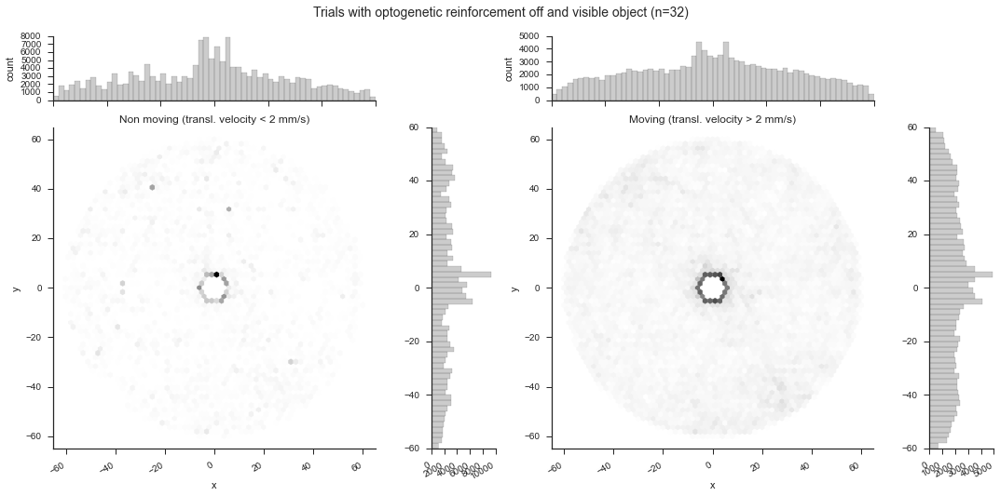

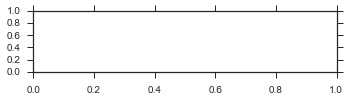

In [133]:
# make fly summary plot of residency:
numBins = 60

keyind_xPos = keylistLong.index('xPosInMiniarena')
keyind_yPos = keylistLong.index('yPosInMiniarena')
keyind_mov = keylistLong.index('moving')
keyind_vT = keylistLong.index('transVelo')

nTrials = (nTrialsNR,nTrialsR)

for indcond, condition in enumerate(['on','off']):
    for indcond2, condition2 in enumerate(['visible','invisible']):
        querystring = '(reinforcement == "' + condition + '") & (trialtype == "'+condition2+'")'
        try:
            xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
            yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
            movingall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1]).squeeze().astype('bool')
            vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()

            movingall = vT>vTransTH

            # make plot
            noNans = ~np.isnan(xPosMAall)
            hexplotfig = residencyWithHistograms_splitOnWalking(
                xPosMAall[noNans], yPosMAall[noNans], movingall[noNans], arenaRad, numBins, vTransTH,
                'Trials with optogenetic reinforcement ' + condition + ' and '+condition2+' object (n=' + str(nTrials[indcond]) + ')')

            try:
                mkdir(analysisDir + 'residencyPlots/')
            except:
                print('Plot directory already exists')
            hexplotfig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]+'_rZones' + condition
                     + '_'+condition2+'Object'+'_residencyMA_splitonwaling_n'+ str(len(flyIDs)) +'.pdf', format='pdf')
        except ValueError:
            print('Condition was not tested.')

### 1D (radial) residency

Plot directory already exists


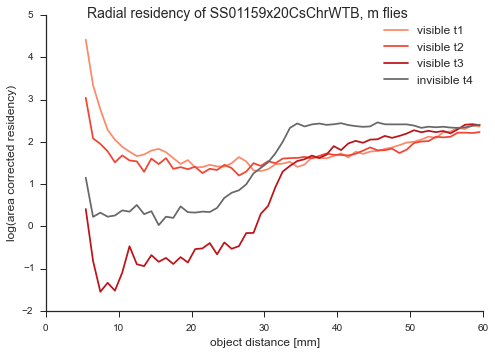

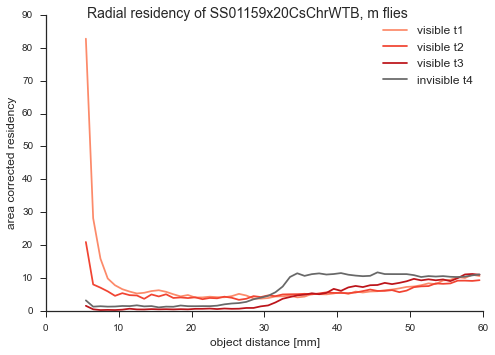

In [177]:
movementFilter = 'moving > 0'
numBins = 55
histRange = (5,arenaRad)

try:
    mkdir(analysisDir + 'residencyPlots/')
except:
    print('Plot directory already exists')

# log residency
radResFig = plt.figure(figsize=(7,5))
radResFig.suptitle('Radial residency of '+genotype+', '+flyIDs[0][0]+' flies',fontsize=14)
radResPlt = radResFig.add_subplot(111)

radResPlt = oneDimResidency_df(radResPlt, FOAllFlies_df, keyind_xPos, keyind_yPos, movementFilter,
                               visibilityState, numBins, histRange,1, True)
myAxisTheme(radResPlt)
radResFig.tight_layout()
radResFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                    + '_radialResidency_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

# linear residency
radResFig = plt.figure(figsize=(7,5))
radResFig.suptitle('Radial residency of '+genotype+', '+flyIDs[0][0]+' flies',fontsize=14)
radResPlt = radResFig.add_subplot(111)

radResPlt = oneDimResidency_df(radResPlt, FOAllFlies_df, keyind_xPos, keyind_yPos, movementFilter,
                               visibilityState, numBins, histRange,1, False)
myAxisTheme(radResPlt)
radResFig.tight_layout()
radResFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                    + '_radialResidency_lin_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

### 1D (radial) residency plot with variance measure based on single fly counts

In [135]:
def oneDimResidencyWithVar_df(radResPlt, FODataframe, flyIDs, keyind_xPos, keyind_yPos, movementFilter, visState, 
                              numBins, histRange, lineAlpha, plotLog, varstyle, fill, condLegend):

    # normalisation factor for cirle area rings
    areaNormA = np.square(np.linspace(histRange[0], histRange[1], numBins))*np.pi
    areaNorm = areaNormA[1:]-areaNormA[:-1]

    # colormap for trials (visible object trials in colour, invisible object trials in grey shades)
    numInvTrials = sum(['invisible' in visState[trial] for trial in range(len(visState))])
    numVisTrials = len(visState)-numInvTrials

    visTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numVisTrials), cmap='Reds')
    invTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=numInvTrials), cmap='Greys')
    trialCMap = [visTrialCMap.to_rgba(visTrial) for visTrial in range(numVisTrials)]
    [trialCMap.append(invTrialCMap.to_rgba(invTrial)) for invTrial in range(numInvTrials)]

    #legendtext = []
    legendhand = []

    for trial, cond in enumerate(visState):
        trialRadRes = np.zeros((numFlies,numBins-1))
        for fly in range(numFlies):
            querystring = '(trialtype=="'+cond+'")&(trial=='+str(trial+1)+')&('+movementFilter\
                            +')&(flyID=="'+flyIDs[fly]+'")'

            xPosMA = np.asarray(FODataframe.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()
            yPosMA = np.asarray(FODataframe.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1]).squeeze()

            # transform trajectory to polar coordinates
            objDist, theta = cartesian2polar(xPosMA, yPosMA)

            radresidency, edges = np.histogram(objDist, bins=np.linspace(histRange[0], histRange[1], numBins))
            trialRadRes[fly,:] = radresidency/areaNorm
            
            jitterRange = 0.2*np.diff(histRange)/numBins
            
            if varstyle == 'dotplot':
                if plotLog:
                    toplot = np.log(radresidency/areaNorm)
                else:
                    toplot = radresidency/areaNorm
                
                radResPlt.plot(edges[:-1]+np.diff(edges)/2.0+np.random.uniform(-jitterRange,jitterRange), toplot,
                               color=trialCMap[trial], linestyle='none', marker='.', alpha=0.5)
        
        if plotLog:
            if varstyle == 'std':
                toplot = np.log(np.nanmean(trialRadRes,0))
                var1 = np.log(np.nanmean(trialRadRes,0) + np.nanstd(trialRadRes,0))
                var2 = np.log(np.nanmean(trialRadRes,0) - np.nanstd(trialRadRes,0))
            elif varstyle == 'iqr':
                toplot = np.log(np.nanmedian(trialRadRes,0))
                [var1,var2] = np.log(np.nanpercentile(trialRadRes,[25,75],axis=0))
            else:
                toplot = np.log(np.nanmean(trialRadRes,0))
                
        else:
            if varstyle == 'std':
                toplot = np.nanmean(trialRadRes,0)
                var1 = toplot + np.nanstd(trialRadRes,0)
                var2 = toplot - np.nanstd(trialRadRes,0)
            elif varstyle == 'iqr':
                toplot = np.nanmedian(trialRadRes,0)
                [var1,var2] = np.nanpercentile(trialRadRes,[25,75],axis=0)
            else:
                toplot = np.nanmean(trialRadRes,0)
        
        if varstyle != 'dotplot':
            lhand, = radResPlt.plot(edges[:-1]+np.diff(edges)/2.0, toplot, color=trialCMap[trial],
                                    alpha=lineAlpha,linewidth=3)
            radResPlt.plot(edges[:-1]+np.diff(edges)/2.0, var1,color=trialCMap[trial], alpha=lineAlpha,linewidth=1)
            radResPlt.plot(edges[:-1]+np.diff(edges)/2.0, var2,color=trialCMap[trial], alpha=lineAlpha,linewidth=1)
            if fill:
                #radResPlt.fill_between(edges[:-1]+np.diff(edges)/2.0, np.maximum(var1,-6), np.maximum(var2,-6), color=trialCMap[trial], alpha=0.2)
                radResPlt.fill_between(edges[:-1]+np.diff(edges)/2.0, var1, var2, color=trialCMap[trial], alpha=0.2)
        else:
            lhand, = radResPlt.plot(edges[:-1]+np.diff(edges)/2.0, toplot, color=trialCMap[trial], alpha=lineAlpha,linewidth=3)            

        legendhand.append(lhand)
        #legendtext.append(cond + ' t' + str(trial+1))

    plt.legend(legendhand,condLegend, loc='best', fontsize=12)
    radResPlt.set_xlabel('object distance [mm]', fontsize=12)
    if plotLog:
        radResPlt.set_ylabel('log(area corrected residency)', fontsize=12)
    else:
        radResPlt.set_ylabel('area corrected residency', fontsize=12)

    return radResPlt

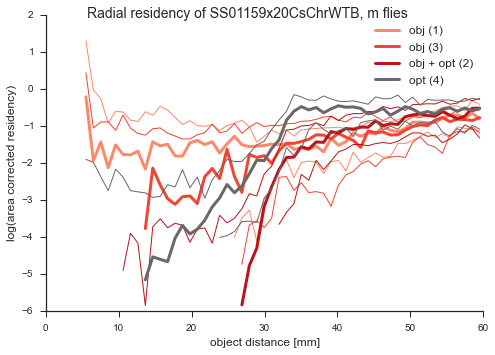

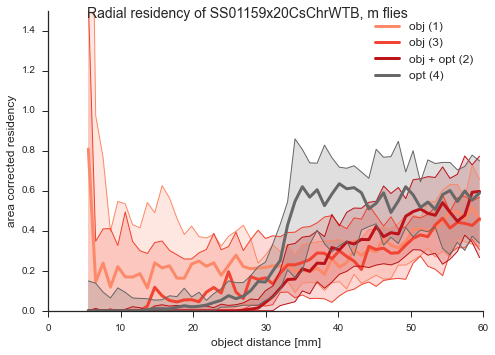

In [178]:
movementFilter = 'moving > 0'
numBins = 55
histRange = (5,arenaRad)
varStyle = 'iqr' #'std', 'iqr' 'dotplot'
fill = False

# log residency
radResFig = plt.figure(figsize=(7,5))
radResFig.suptitle('Radial residency of '+genotype+', '+flyIDs[0][0]+' flies',fontsize=14)
radResPlt = radResFig.add_subplot(111)

radResPlt = oneDimResidencyWithVar_df(radResPlt, FOAllFlies_df, flyIDs, keyind_xPos, keyind_yPos, movementFilter,
                                      visibilityState, numBins, histRange, 1, True, varStyle, fill, trialName)
myAxisTheme(radResPlt)
radResFig.tight_layout()
radResFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                    + '_radialResidencyVar_'+varStyle+'_log_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

# linear residency
radResFig = plt.figure(figsize=(7,5))
radResFig.suptitle('Radial residency of '+genotype+', '+flyIDs[0][0]+' flies',fontsize=14)
radResPlt = radResFig.add_subplot(111)

radResPlt = oneDimResidencyWithVar_df(radResPlt, FOAllFlies_df, flyIDs, keyind_xPos, keyind_yPos, movementFilter,
                                      visibilityState, numBins, histRange, 1, False, varStyle, True, trialName)
myAxisTheme(radResPlt)
radResPlt.set_ylim(0,1.5)
radResFig.tight_layout()
radResFig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                    + '_radialResidencyVar_'+varStyle+'_lin_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

## Count number of visits (enter radius around landmark)

In [347]:
def countVisits_df(visitRad,fly,trial,allFlies_df,keyind_xPos,keyind_yPos,keyind_gam):
    
    querystring = '(trial==' + str(trial) + ') & (flyID == "'+flyIDs[fly]+'")'
    xPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()
    yPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1]).squeeze()
    gammaTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_gam:keyind_gam+1]).squeeze()

    objDistTrial, thetaTrial = cartesian2polar(xPosTrial, yPosTrial)

    inside = (objDistTrial<visitRad).astype('int')
    time = np.linspace(0,600,len(xPosTrial))

    entries = np.zeros(len(inside))
    entries[1:] = np.diff(inside) == 1

    exits = np.zeros(len(inside))
    exits[1:] = np.diff(inside) == -1

    entryTime = time[entries.astype('bool')]
    exitTime = time[exits.astype('bool')]
    if len(entryTime) != len(exitTime):
        visitT = exitTime[0:min(sum(exits),sum(entries))] - entryTime[0:min(sum(exits),sum(entries))]
    else:
        visitT = exitTime - entryTime
    
    return entries, exits, visitT

In [348]:
def visitTime_df(visitRad,fly,trial,allFlies_df,keyind_xPos,keyind_yPos):
    
    querystring = '(trial==' + str(trial) + ') & (flyID == "'+flyIDs[fly]+'")'
    xPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1]).squeeze()
    yPosTrial = np.asarray(allFlies_df.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1]).squeeze()

    objDistTrial, thetaTrial = cartesian2polar(xPosTrial, yPosTrial)

    inside = (objDistTrial<visitRad).astype('int')
    time = np.linspace(0,600,len(xPosTrial))

    entries = np.zeros(len(inside))
    entries[1:] = np.diff(inside) == 1

    exits = np.zeros(len(inside))
    exits[1:] = np.diff(inside) == -1

    entryTime = time[entries.astype('bool')]
    exitTime = time[exits.astype('bool')]
    
    return entries, exits, time, entryTime, exitTime

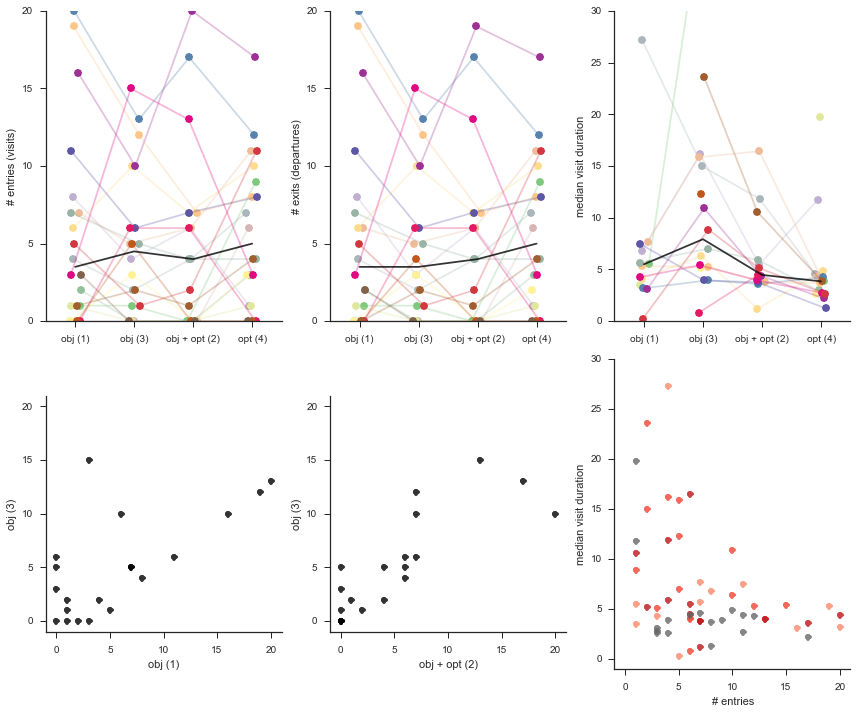

In [349]:
visitRad = 20
numtrials = 4

numEntries = np.zeros((numFlies,numtrials))
numExits = np.zeros((numFlies,numtrials))
lengthVisit = np.zeros((numFlies,numtrials))
jitter = np.zeros((numFlies,numtrials))

visitFig = plt.figure(figsize=(12,10))

numEntryPlt = visitFig.add_subplot(231)
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
numExitPlt = visitFig.add_subplot(232)
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
meanVisitPlt = visitFig.add_subplot(233)
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

for fly in range(numFlies):
    for trial in range(numtrials):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        entries, exits, visitDuration = countVisits_df(visitRad,fly,trial+1,FOAllFlies_df,keyind_xPos,keyind_yPos,keyind_gam)
        numEntry = sum(entries)
        numExit = sum(exits)
        
        numEntries[fly,trial] = numEntry
        numExits[fly,trial] = numExit
        lengthVisit[fly,trial] = np.nanmedian(visitDuration)

        numEntryPlt.plot(trial+1+tJitter,numEntry,'.',markersize=15,color=flyCMap.to_rgba(fly))
        numExitPlt.plot(trial+1+tJitter,numExit,'.',markersize=15,color=flyCMap.to_rgba(fly))
        meanVisitPlt.plot(trial+1+tJitter,np.nanmedian(visitDuration),'.',markersize=15,color=flyCMap.to_rgba(fly))
        
    numEntryPlt.plot(range(1,numtrials+1)+jitter[fly,:],numEntries[fly,:],
                     '-',markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    numExitPlt.plot(range(1,numtrials+1)+jitter[fly,:] ,numExits[fly,:],'-',
                    markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    meanVisitPlt.plot(range(1,numtrials+1)+jitter[fly,:],lengthVisit[fly,:],'-',
                      markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)

#plot average response
numEntryPlt.plot(range(1,5),np.nanmedian(numEntries,axis=0),color='k',alpha=0.8)
numExitPlt.plot(range(1,5),np.nanmedian(numExits,axis=0),color='k',alpha=0.8)
meanVisitPlt.plot(range(1,5),np.nanmedian(lengthVisit,axis=0),color='k',alpha=0.8)

numEntryPlt.set_ylabel('# entries (visits)')
numEntryPlt.set_ylim(0,20)
numEntryPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(numEntryPlt)

numExitPlt.set_ylabel('# exits (departures)')
numExitPlt.set_ylim(0,20)
numExitPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(numExitPlt)

meanVisitPlt.set_ylabel('median visit duration')
meanVisitPlt.set_ylim(0,30)
meanVisitPlt.set_xlim(0.5,numtrials+0.5)
myAxisTheme(meanVisitPlt)

#correlations
prepostPlt = visitFig.add_subplot(234)
prepostPlt.plot(numEntries[:,0],numEntries[:,1],'o', color='k',alpha=0.8)
prepostPlt.set_ylim(-1,np.max(numEntries)+1); prepostPlt.set_xlim(-1,np.max(numEntries)+1)
prepostPlt.set_aspect('equal')
prepostPlt.set_xlabel(trialName[0]); prepostPlt.set_ylabel(trialName[1])
myAxisTheme(prepostPlt)

trainpostPlt = visitFig.add_subplot(235)
trainpostPlt.plot(numEntries[:,2],numEntries[:,1],'o', color='k',alpha=0.8)
trainpostPlt.set_ylim(-1,np.max(numEntries)+1); trainpostPlt.set_xlim(-1,np.max(numEntries)+1)
trainpostPlt.set_aspect('equal')
trainpostPlt.set_xlabel(trialName[2]); trainpostPlt.set_ylabel(trialName[1])
myAxisTheme(trainpostPlt)

entryLengthPlt = visitFig.add_subplot(236)
visTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=3), cmap='Reds')
invTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=1), cmap='Greys')
trialCMap = [visTrialCMap.to_rgba(visTrial) for visTrial in range(3)]
[trialCMap.append(invTrialCMap.to_rgba(invTrial)) for invTrial in range(1)]

for trial in range(4):
    entryLengthPlt.plot(numEntries[:,trial],lengthVisit[:,trial],'o', color=trialCMap[trial],alpha=0.8)

entryLengthPlt.set_xlim(-1,np.max(numEntries)+1); entryLengthPlt.set_ylim(-1,30)
entryLengthPlt.set_xlabel('# entries'); entryLengthPlt.set_ylabel('median visit duration')
myAxisTheme(entryLengthPlt)

visitFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'visitAnalysis' + sep)
except OSError:
    print('Analysis directory already exists.')

visitFig.savefig(analysisDir + 'visitAnalysis/'  + genotype
                   + '_visitsInRad'+str(visitRad)+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

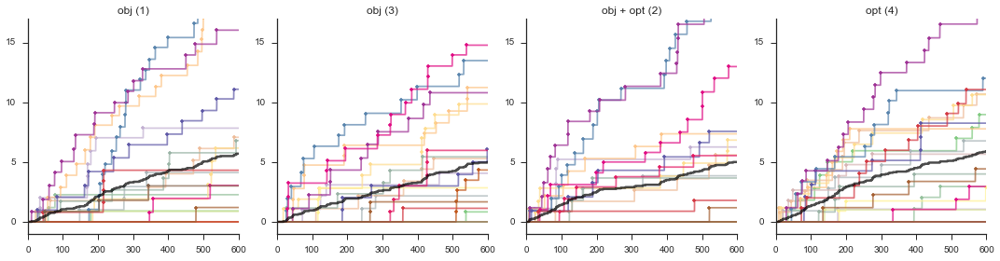

In [350]:
visitRad = 20
numtrials = 4
ymaxval = 17

visitFig = plt.figure(figsize=(15,4))

maxVisit = 0
for trial in range(1,5):
    cumVisitPlt = visitFig.add_subplot(1,4,trial)
    
    allEntries = np.zeros(10*60*20)

    for fly in range(numFlies):
        entries, exits, time, entryTime, exitTime = visitTime_df(visitRad,fly,trial,FOAllFlies_df,keyind_xPos,keyind_yPos)
        entriesCS = np.cumsum(entries + entries*np.random.uniform(-0.2, 0.2,len(entries)))
        cumVisitPlt.plot(time,entriesCS,color=flyCMap.to_rgba(fly),alpha=0.7)
        cumVisitPlt.plot(time[entries>0],entriesCS[entries>0],color=flyCMap.to_rgba(fly),marker='.',linestyle='none')
        maxVisit = max(maxVisit,sum(entries))
        if len(entries) == 10*60*20:
            allEntries = allEntries + entries
            
        
    
    try:
        cumVisitPlt.plot(time,np.cumsum(allEntries/(numFlies*np.ones(len(time)))),color='k',alpha=0.7,linewidth=2.5)
    except:
        print('not enought data')
    cumVisitPlt.set_ylim(-1,min(ymaxval,maxVisit+1))
    cumVisitPlt.set_title(trialName[trial-1])
    myAxisTheme(cumVisitPlt)
    

visitFig.tight_layout()
    
visitFig.savefig(analysisDir + 'visitAnalysis/'  + genotype
                   + '_cumVisitPlt_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

## Encounter with reinforcement zone (example)

In [320]:
def plotResponseInZone(fly, trial, tSt, tEnd,maxEv,sizeScale):

    querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'

    perFlyRVal = FOAllFlies_df.query(querystring).iloc[:,keyind_event:keyind_event+1].squeeze().astype('float').values
    perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
    perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
    perFlyGamma = FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1].squeeze().astype('float').values

    time = np.linspace(0,600,len(perFlyTra))

    encounterFig = plt.figure(figsize=(15,10))
    gs = gridspec.GridSpec(4,2 ,width_ratios=[1,0.2])


    evplot = encounterFig.add_subplot(gs[0,0])
    evplot.plot(time[tSt:tEnd],perFlyRVal[tSt:tEnd],'k',alpha=0.5)
    evplot.scatter(time[tSt:tEnd],perFlyRVal[tSt:tEnd],s=sizeScale*perFlyRVal[tSt:tEnd],c=perFlyRVal[tSt:tEnd],
                   cmap='gnuplot',vmin=0,vmax=maxEv,edgecolors='face')
    evplot.set_ylabel('light stimulation level [%]')
    evplot.set_xlim(time[tSt],time[tEnd])
    myAxisTheme(evplot)

    tvplot = encounterFig.add_subplot(gs[1,0])
    tvplot.plot(time[tSt:tEnd],perFlyTra[tSt:tEnd],'k',alpha=0.5)
    tvplot.scatter(time[tSt:tEnd],perFlyTra[tSt:tEnd],s=sizeScale*perFlyRVal[tSt:tEnd],c=perFlyRVal[tSt:tEnd],
                   cmap='gnuplot',vmin=0,vmax=maxEv,edgecolors='face')
    tvplot.set_ylim(0,40)
    tvplot.set_xlim(time[tSt],time[tEnd])
    tvplot.set_ylabel('transl. velocity [mm/s]')
    myAxisTheme(tvplot)

    rvplot = encounterFig.add_subplot(gs[2,0])
    rvplot.plot(time[tSt:tEnd],perFlyRot[tSt:tEnd],'k',alpha=0.5)
    rvplot.scatter(time[tSt:tEnd],perFlyRot[tSt:tEnd],s=sizeScale*perFlyRVal[tSt:tEnd],c=perFlyRVal[tSt:tEnd],
                   cmap='gnuplot',vmin=0,vmax=maxEv,edgecolors='face')
    rvplot.set_ylim(-6,6)
    rvplot.set_xlim(time[tSt],time[tEnd])
    rvplot.set_ylabel('rot. velocity [deg/s]')
    myAxisTheme(rvplot)

    rhplot = encounterFig.add_subplot(gs[3,0])
    rhplot.plot(time[tSt:tEnd],perFlyGamma[tSt:tEnd],'k',alpha=0.5)
    rhplot.scatter(time[tSt:tEnd],perFlyGamma[tSt:tEnd],s=sizeScale*perFlyRVal[tSt:tEnd],c=perFlyRVal[tSt:tEnd],
                   cmap='gnuplot',vmin=0,vmax=maxEv,edgecolors='face')
    rhplot.set_ylim(0,np.pi)
    rhplot.set_xlim(time[tSt],time[tEnd])
    rhplot.set_ylabel('rel. heading [rad]')
    myAxisTheme(rhplot)

    evplot = encounterFig.add_subplot(gs[1,1])
    evplot.plot(perFlyRVal,perFlyTra,'k.',alpha=0.8)
    evplot.set_ylim(0,40)
    myAxisTheme(evplot)

    evplot = encounterFig.add_subplot(gs[2,1])
    evplot.plot(perFlyRVal,perFlyRot,'k.',alpha=0.8)
    evplot.set_ylim(-6,6)
    myAxisTheme(evplot)

    evplot = encounterFig.add_subplot(gs[3,1])
    evplot.plot(perFlyRVal,perFlyGamma,'k.',alpha=0.8)
    evplot.set_ylim(0,np.pi)
    myAxisTheme(evplot)

In [321]:
rZone_max

15

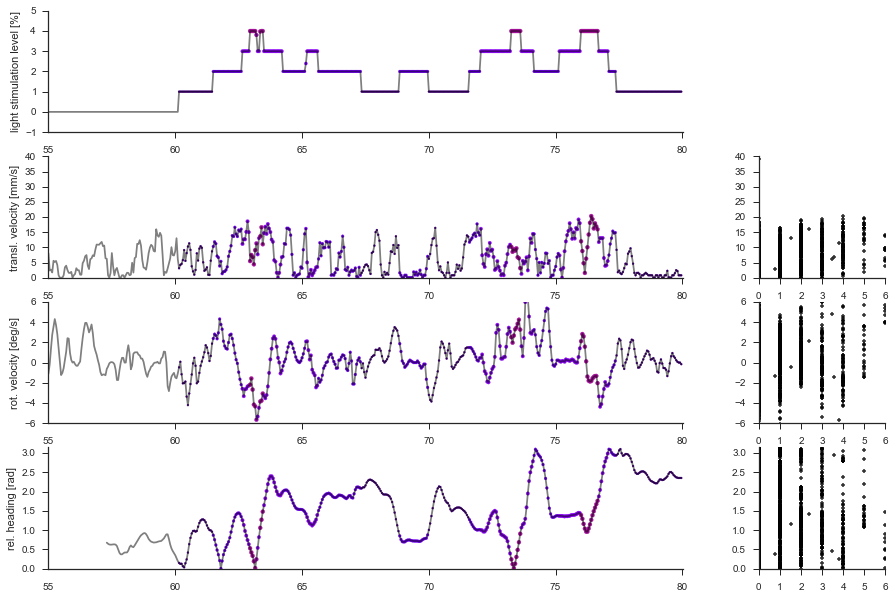

In [326]:
fly = 15
trial = 2

tSt = 20*55
tEnd = tSt+ 20*25

maxEv = rZone_max-5
sizeScale = 40.0/maxEv

plotResponseInZone(fly, trial, tSt, tEnd,maxEv,sizeScale)

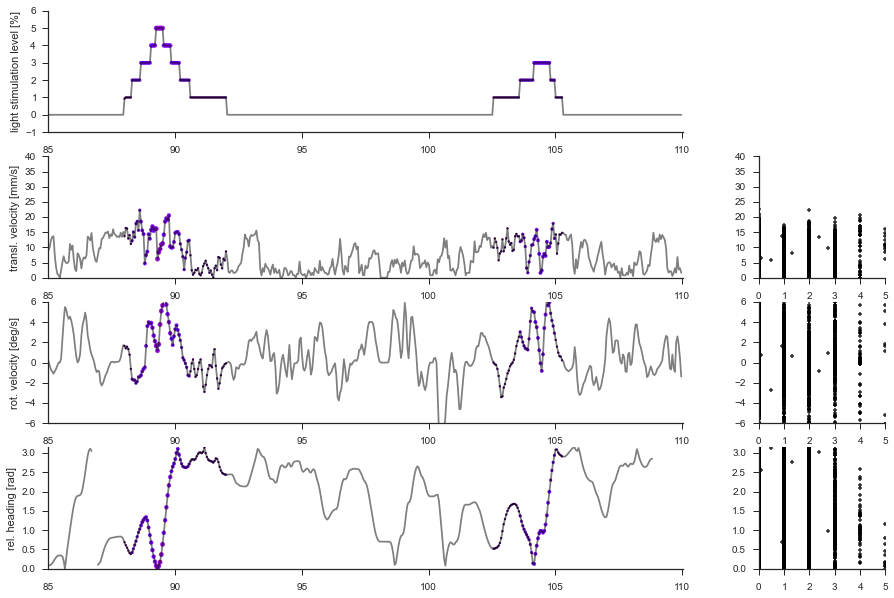

In [327]:
fly = 15
trial = 3

tSt = 20*85
tEnd = tSt+ 20*25

maxEv = rZone_max

plotResponseInZone(fly, trial, tSt, tEnd,maxEv,sizeScale)

measurement missing


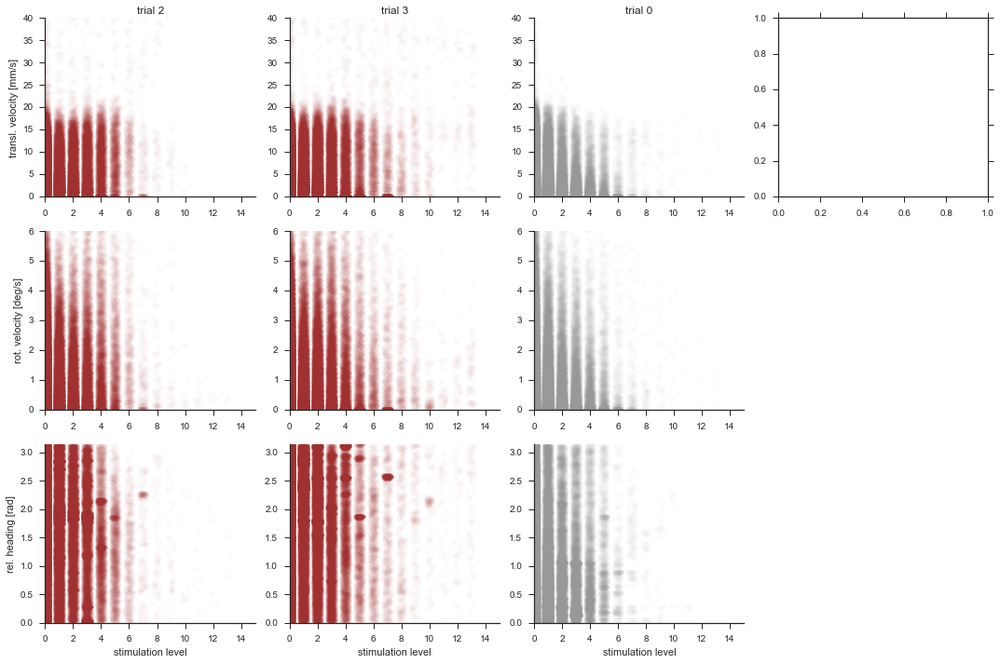

In [336]:
trialList = [2,3,0,0]
eventTList = [2,3,2,3]
tCol = ['darkred','darkred','grey','grey']
aval = 0.02

maxStimLevel = rZone_max

encounterFig = plt.figure(figsize=(15,10))
gs = gridspec.GridSpec(3,len(trialList)) #,width_ratios=[1,1])

for tInd in range(len(trialList)):
    trial = trialList[tInd]
    
    querystring = '(trial == ' + str(eventTList[tInd]+1) + ')'
    perFlyRVal = FOAllFlies_df.query(querystring).iloc[:,keyind_event:keyind_event+1].squeeze().astype('float').values
    
    perFlyRVal = perFlyRVal+np.random.uniform(-0.25, 0.25,np.size(perFlyRVal))
    
    querystring = '(trial == ' + str(trial+1) + ')'
    perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
    perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
    perFlyGamma = FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1].squeeze().astype('float').values

    try:
        tvplot = encounterFig.add_subplot(gs[0,tInd])
        tvplot.plot(perFlyRVal,perFlyTra,'o',color=tCol[tInd], alpha=aval)
        tvplot.set_ylim(0,40)
        tvplot.set_xlim(0,maxStimLevel)
        tvplot.set_title('trial '+ str(trialList[tInd]))
        myAxisTheme(tvplot)

        rvplot = encounterFig.add_subplot(gs[1,tInd])
        rvplot.plot(perFlyRVal,abs(perFlyRot),'o',color=tCol[tInd], alpha=aval)
        rvplot.set_ylim(0,6)
        rvplot.set_xlim(0,maxStimLevel)
        myAxisTheme(rvplot)

        rhplot = encounterFig.add_subplot(gs[2,tInd])
        rhplot.plot(perFlyRVal,perFlyGamma,'o',color=tCol[tInd], alpha=aval)
        rhplot.set_ylim(0,np.pi)
        rhplot.set_xlim(0,maxStimLevel)
        rhplot.set_xlabel('stimulation level')
        myAxisTheme(rhplot)
    except:
        print('measurement missing')
    
    if tInd<1:
        tvplot.set_ylabel('transl. velocity [mm/s]')
        rvplot.set_ylabel('rot. velocity [deg/s]')
        rhplot.set_ylabel('rel. heading [rad]')

encounterFig.tight_layout()     

## Check if flies cluster in space formed by combinations, i.e. if different behavioural measures are correlated

## TODO: Generate data frame containing per fly averages for
### * percent time spent moving
### * average transl. velocity while moving
### * rotational velocity while moving
### * number of turns
### * number of visits
### * fraction of time spent within 20 mm radius around object


In [337]:
# make fly summary plot of residency:
arenaRad = 60
numtrials = len(visibilityState)
numVItrials = sum(['visible' in visibilityState[trial] for trial in range(len(visibilityState))])
numIVtrials = len(visibilityState)-numVItrials

minTurnDist = 5

minDist = 5
maxDist = 60

visitRad = 20

# Compute turn thresholds
# Only include moving flies
querystring = '(moving > 0)'
vRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
time = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

# Find turnTH over all flies
vRot_filt = np.convolve(vRot, np.ones((5,))/5, mode='same')
turnTH_pos = 2*np.std(vRot_filt[vRot_filt>=0])
turnTH_neg = -2*np.std(vRot_filt[vRot_filt<=0])

# Per fly quantities to be computed
percentMoving = np.zeros((numFlies,numtrials))
perFlyTurnTH = np.zeros((numFlies,numtrials)) #time spent turning
perFlyNumTurn = np.zeros((numFlies,numtrials))
perFlyvRot = np.zeros((numFlies,numtrials))
perFlyvTrans = np.zeros((numFlies,numtrials))
perFlyTurnSeqBias = np.zeros((numFlies,numtrials))

numEntries = np.zeros((numFlies,numtrials))
numExits = np.zeros((numFlies,numtrials))
lengthVisit = np.zeros((numFlies,numtrials))
percentInZone = np.zeros((numFlies,numtrials))
visitsZone = np.zeros((numFlies,numtrials))

jitter = np.zeros((numFlies,numtrials))

for trial in range(numtrials):
    for fly in range(numFlies):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +'")'\
                        +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        
        percentMoving[fly,trial] = 100*sum(perFlyMoving)/max(1,len(perFlyMoving))

        if perFlyMoving.size < 5:
            continue
            
        if (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving)) < 1:
            percentMoving[fly,trial] = np.nan
            perFlyTurnTH[fly,trial] = np.nan
            perFlyNumTurn[fly,trial] = np.nan
            perFlyvRot[fly,trial] = np.nan
            perFlyTurnSeqBias[fly,trial] = np.nan
            continue

        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                      +'& (objectDistance >='+str(minDist)+') & (objectDistance <='+str(maxDist)+')'
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float')
        perFlyObjDist = FOAllFlies_df.query(querystring).iloc[:,keyind_objD:keyind_objD+1].squeeze().astype('float')
        
        #meanObjDist[fly,trial] = np.nanmedian(perFlyObjDist)
        
        perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
        
        perFlyRot_filt = np.convolve(perFlyRot, np.ones((5,))/5, mode='same')
        
        turnMask = np.logical_or(perFlyRot_filt>turnTH_pos,perFlyRot_filt<turnTH_neg)
        turnLoc = np.where(turnMask>0)[0]
        turnStart = turnLoc[np.where(np.hstack((0,np.diff(turnLoc)))>minTurnDist)[0]]
        turnSide = np.sign(perFlyRot[turnStart])
        
        try:
            turnSeq = np.zeros(len(turnStart)-1)
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==0.5)[0]] = 2
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-0.5)[0]] = 3
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-1.5)[0]] = 0
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-2.5)[0]] = 1
            
            numBin = 4
            [n,edgs] = np.histogram(turnSeq,bins=numBin)
        
        except ValueError:
            print('Not enought turns in fly' + str(fly))
            n = np.ones(numBin)*np.nan
            
        #collect data
        perFlyTurnTH[fly,trial] = 100.0*(sum(perFlyRot_filt>turnTH_pos) + sum(perFlyRot_filt<turnTH_neg))/max(1,len(perFlyRot_filt))
        perFlyNumTurn[fly,trial] = len(turnStart)
        perFlyvRot[fly,trial] = np.nanmedian(perFlyRot)
        perFlyvTrans[fly,trial] = np.nanmedian(perFlyTra)

        if sum(n)==0:
            perFlyTurnSeqBias[fly,trial] = np.nan
        else:
            perFlyTurnSeqBias[fly,trial] = float(sum(n[2:]))/sum(n)
            
            
        entries, exits, visitDuration = countVisits_df(visitRad,fly,trial+1,FOAllFlies_df,keyind_xPos,keyind_yPos,keyind_gam)

        numEntries[fly,trial] = sum(entries)
        numExits[fly,trial] = sum(exits)
        lengthVisit[fly,trial] = np.nanmedian(visitDuration)
        
        percentInZone[fly,trial] = 100*sum(perFlyObjDist < 35)/len(perFlyObjDist)
        
        entries, exits, visitDuration = countVisits_df(35,fly,trial+1,FOAllFlies_df,keyind_xPos,keyind_yPos,keyind_gam)
        visitsZone[fly,trial] = sum(entries)

Not enought turns in fly12


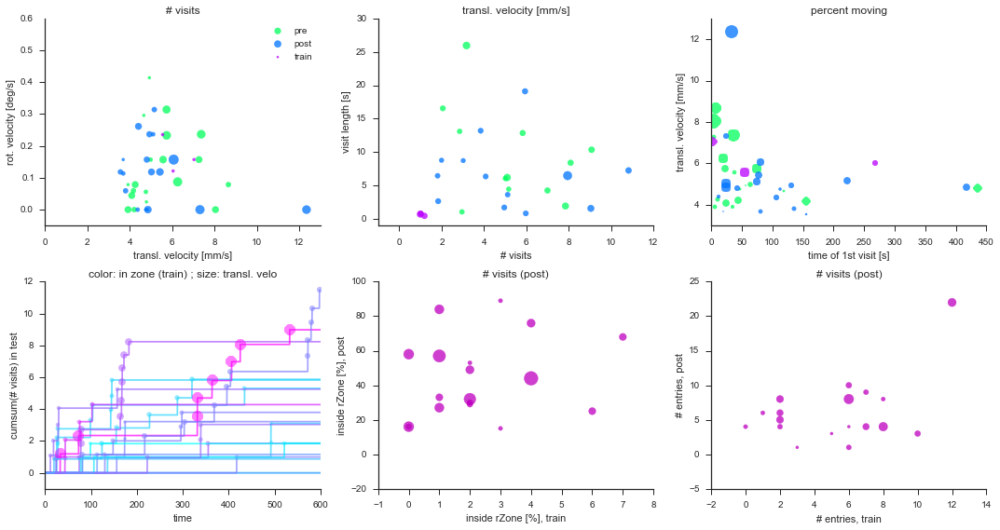

In [338]:
trialComparisonFig = plt.figure(figsize=(15,8))
gs = gridspec.GridSpec(2,3) #,width_ratios=[1,0.9])

#define color maps
visTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=3), cmap='hsv') #Reds
invTrialCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-2, vmax=1), cmap='Greys')
trialCMap = [visTrialCMap.to_rgba(visTrial) for visTrial in range(3)]
[trialCMap.append(invTrialCMap.to_rgba(invTrial)) for invTrial in range(1)]

vTransCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=-1, vmax=np.max(perFlyvTrans)), cmap='Blues')


#plots
transVsRotVsVisitsPlt = trialComparisonFig.add_subplot(gs[0,0])
for trial in range(3):
    transVsRotVsVisitsPlt.scatter(perFlyvTrans[:,trial],abs(perFlyvRot[:,trial]),10*numEntries[:,trial],
                                  color=trialCMap[trial],alpha=0.75)
transVsRotVsVisitsPlt.legend(['pre','post','train'])
transVsRotVsVisitsPlt.set_xlabel('transl. velocity [mm/s]')
transVsRotVsVisitsPlt.set_ylabel('rot. velocity [deg/s]')
transVsRotVsVisitsPlt.set_xlim(0,13)
transVsRotVsVisitsPlt.set_ylim(-.05,.6)
transVsRotVsVisitsPlt.set_title('# visits')
myAxisTheme(transVsRotVsVisitsPlt)
#transVsRotVsVisitsPlt.legend(trialName[0:trial+1])


transVsRotVsDurPlt = trialComparisonFig.add_subplot(gs[0,1])
for trial in range(3):
    
    transVsRotVsDurPlt.scatter(numEntries[:,trial]+np.random.uniform(-0.2, 0.2,numFlies),
                               lengthVisit[:,trial],7*perFlyvTrans[:,trial],
                               color=trialCMap[trial],alpha=0.75)
    transVsRotVsDurPlt.set_xlabel('# visits')
    transVsRotVsDurPlt.set_ylabel('visit length [s]')
    transVsRotVsDurPlt.set_xlim(-1,np.max(numEntries)+1)
    transVsRotVsDurPlt.set_ylim(-1,30)
    transVsRotVsDurPlt.set_title('transl. velocity [mm/s]')
    myAxisTheme(transVsRotVsDurPlt)
#transVsRotVsDurPlt.legend(trialName[0:trial+1])7


transVsRotVsDurPlt = trialComparisonFig.add_subplot(gs[0,2])
# time of first visit vs. transl. velo
for trial in range(1,4):
    for fly in range(numFlies):
        entries, exits, time, entryTime, exitTime = visitTime_df(visitRad,fly,trial,FOAllFlies_df,keyind_xPos,keyind_yPos)
        try:
            transVsRotVsDurPlt.plot(entryTime[0],perFlyvTrans[fly,trial-1], 
                                    marker='o',markersize=0.2*percentMoving[fly,trial-1],
                                    color=trialCMap[trial-1],alpha=0.75)
        except:
            trial = trial+0

transVsRotVsDurPlt.set_xlabel('time of 1st visit [s]')
transVsRotVsDurPlt.set_ylabel('transl. velocity [mm/s]')
#transVsRotVsDurPlt.set_xlim(-1,np.max(numEntries)+1)
#transVsRotVsDurPlt.set_ylim(-1,60)
transVsRotVsDurPlt.set_title('percent moving')
myAxisTheme(transVsRotVsDurPlt)

#trial = 0
#transVsRotVsDurPlt.scatter(numEntries[:,0]+np.random.uniform(-0.2, 0.2,numFlies),
#                           percentInZone[:,2],2*percentMoving[:,2], color='m',alpha=0.5)
#transVsRotVsDurPlt.scatter(numEntries[:,0]+np.random.uniform(-0.2, 0.2,numFlies),
#                           percentInZone[:,1],2*percentMoving[:,1], color='b',alpha=0.5)
#transVsRotVsDurPlt.set_xlabel('# visits (pre)')
#transVsRotVsDurPlt.set_ylabel('inside rZone [%], train(m) & test (b)')
#transVsRotVsDurPlt.set_xlim(-1,np.max(numEntries)+1)
#transVsRotVsDurPlt.set_ylim(-1,60)
#transVsRotVsDurPlt.set_title('percent moving; train(m) & test (b)')
#myAxisTheme(transVsRotVsDurPlt)


cumVisitPlt =trialComparisonFig.add_subplot(gs[1,0])
ymaxval = 15
trial = 1 #post
allEntries = np.zeros(10*60*20)
visitRad = 20

inZoneCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=np.max(percentInZone[:,2])), cmap='cool')
zoneVisitCMap = plt.cm.ScalarMappable(norm=colors.Normalize(vmin=0, vmax=np.max(visitsZone[:,2])), cmap='cool')
for fly in range(numFlies):
    entries, exits, time, entryTime, exitTime = visitTime_df(visitRad,fly,trial+1,FOAllFlies_df,keyind_xPos,keyind_yPos)
    entriesCS = np.cumsum(entries + entries*np.random.uniform(-0.2, 0.2,len(entries)))
    cumVisitPlt.plot(time,entriesCS,color=zoneVisitCMap.to_rgba(visitsZone[fly,2]),alpha=0.7)
    cumVisitPlt.plot(time[entries>0],entriesCS[entries>0],color=zoneVisitCMap.to_rgba(visitsZone[fly,2]),
                     marker='o',markersize=1.0*perFlyvTrans[fly,1],linestyle='none',alpha=0.5)

cumVisitPlt.set_ylim(-1,min(ymaxval,maxVisit+1))
cumVisitPlt.set_xlabel('time')
cumVisitPlt.set_ylabel('cumsum(# visits) in test')
cumVisitPlt.set_title('color: in zone (train) ; size: transl. velo')
myAxisTheme(cumVisitPlt)
    
    

transVsRotVsDurPlt = trialComparisonFig.add_subplot(gs[1,1])
transVsRotVsDurPlt.scatter(percentInZone[:,2],percentInZone[:,1],20*numEntries[:,1],
                           color='m', alpha=0.75)
transVsRotVsDurPlt.set_xlabel('inside rZone [%], train')
transVsRotVsDurPlt.set_ylabel('inside rZone [%], post')
#transVsRotVsDurPlt.set_xlim(-1,80)
#transVsRotVsDurPlt.set_ylim(-1,80)
#transVsRotVsDurPlt.set_aspect('equal')
transVsRotVsDurPlt.set_title('# visits (post)')
myAxisTheme(transVsRotVsDurPlt)
#transVsRotVsDurPlt.legend(trialName[0:trial+1])7


transVsRotVsDurPlt = trialComparisonFig.add_subplot(gs[1,2])
transVsRotVsDurPlt.scatter(visitsZone[:,2],visitsZone[:,1],10*numEntries[:,1],#10*perFlyvTrans[:,1],
                           color='m', alpha=0.75)
transVsRotVsDurPlt.set_xlabel('# entries, train')
transVsRotVsDurPlt.set_ylabel('# entries, post')
#transVsRotVsDurPlt.set_xlim(-1,80)
#transVsRotVsDurPlt.set_ylim(-1,80)
transVsRotVsDurPlt.set_title('# visits (post)') #transl. velocity [mm/s]
myAxisTheme(transVsRotVsDurPlt)



trialComparisonFig.tight_layout()

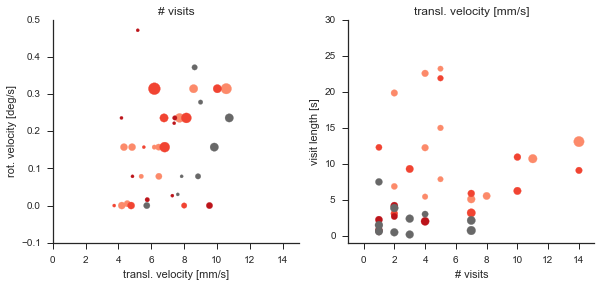

In [238]:
trialComparisonFig = plt.figure(figsize=(15,4))
gs = gridspec.GridSpec(1,3) #,width_ratios=[1,0.9])

transVsRotVsVisitsPlt = trialComparisonFig.add_subplot(gs[0,0])
for trial in range(4):
    transVsRotVsVisitsPlt.scatter(perFlyvTrans[:,trial],abs(perFlyvRot[:,trial]),10*numEntries[:,trial],color=trialCMap[trial])
    transVsRotVsVisitsPlt.set_xlabel('transl. velocity [mm/s]')
    transVsRotVsVisitsPlt.set_ylabel('rot. velocity [deg/s]')
    transVsRotVsVisitsPlt.set_xlim(0,15)
    transVsRotVsVisitsPlt.set_ylim(-.1,.5)
    transVsRotVsVisitsPlt.set_title('# visits')
    myAxisTheme(transVsRotVsVisitsPlt)
#transVsRotVsVisitsPlt.legend(trialName[0:trial+1])

transVsRotVsDurPlt = trialComparisonFig.add_subplot(gs[0,1])
for trial in range(4):
    
    transVsRotVsDurPlt.scatter(numEntries[:,trial],lengthVisit[:,trial],7*perFlyvTrans[:,trial],color=trialCMap[trial])
    transVsRotVsDurPlt.set_xlabel('# visits')
    transVsRotVsDurPlt.set_ylabel('visit length [s]')
    transVsRotVsDurPlt.set_xlim(-1,np.max(numEntries)+1)
    transVsRotVsDurPlt.set_ylim(-1,30)
    transVsRotVsDurPlt.set_title('transl. velocity [mm/s]')
    myAxisTheme(transVsRotVsDurPlt)
#transVsRotVsDurPlt.legend(trialName[0:trial+1])

trialComparisonFig.tight_layout()

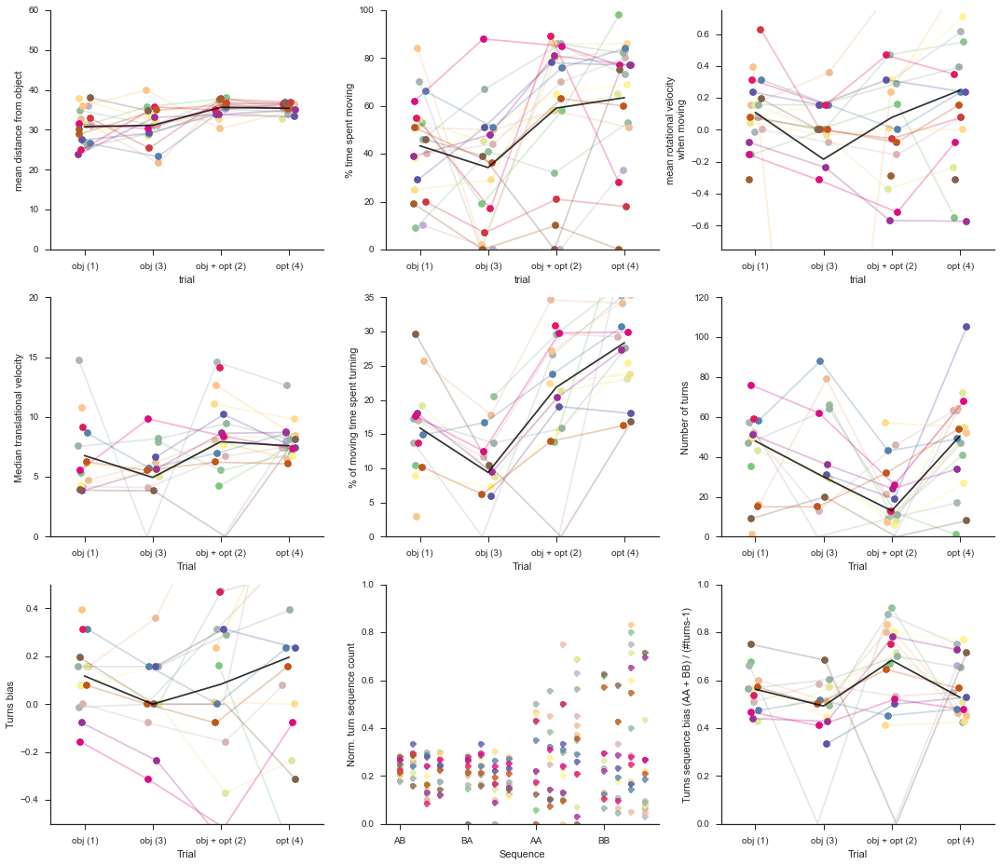

In [206]:
# make fly summary plot of residency:
arenaRad = 60
numtrials = len(visibilityState)
numVItrials = sum(['visible' in visibilityState[trial] for trial in range(len(visibilityState))])
numIVtrials = len(visibilityState)-numVItrials

minTurnDist = 5

minDist = 10
maxDist = 40

trialComparisonFig = plt.figure(figsize=(15,13))
gs = gridspec.GridSpec(3,3) #,width_ratios=[1,0.9])

nTrial = [nTrialsNR/2, nTrialsNR/2,nTrialsR/2, nTrialsIN]

# Top row plots: ...............................................................................................

# Plots of (a) percent of time spent moving, (b) rotational bias and (c) mean distance from object
percentMoving = np.zeros((numFlies,numtrials))
rotationBias = np.zeros((numFlies,numtrials))
meanObjDist = np.zeros((numFlies,numtrials))
jitter = np.zeros((numFlies,numtrials))

perFlyMeanDistPlt = trialComparisonFig.add_subplot(gs[0,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[0,1])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyRotBiasPlt = trialComparisonFig.add_subplot(gs[0,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')


for fly in range(numFlies):
    for trial in range(numtrials):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +'")'\
                        +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                       +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float')
        perFlyObjDist = FOAllFlies_df.query(querystring).iloc[:,keyind_objD:keyind_objD+1].squeeze().astype('float')
        
        percentMoving[fly,trial] = 100*sum(perFlyMoving)/max(1,len(perFlyMoving))
        rotationBias[fly,trial] = np.nanmedian(perFlyRot)
        meanObjDist[fly,trial] = np.nanmedian(perFlyObjDist)
        
        perFlyMovingPlt.plot(trial+1+tJitter,percentMoving[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))

        perFlyRotBiasPlt.plot(trial+1+tJitter,rotationBias[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))
        
        perFlyMeanDistPlt.plot(trial+1+tJitter,meanObjDist[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))
        
        
    perFlyMovingPlt.plot(range(1,numtrials+1)+jitter[fly,:],percentMoving[fly,:],
                         '-',markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    
    perFlyRotBiasPlt.plot(range(1,numtrials+1)+jitter[fly,:] ,rotationBias[fly,:],'-',
                          markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
        
    perFlyMeanDistPlt.plot(range(1,numtrials+1)+jitter[fly,:],meanObjDist[fly,:],'-',
                         markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    
    
#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyRotBiasPlt.plot(range(1,numtrials+1),np.nanmean(rotationBias,axis=0),color='k',alpha=0.8)
perFlyMeanDistPlt.plot(range(1,numtrials+1),np.nanmean(meanObjDist,axis=0),color='k',alpha=0.8)

# Beautify axes
perFlyMeanDistPlt.set_ylim(0,arenaRad)
perFlyMeanDistPlt.set_xlim(0.5,numtrials+0.5)
perFlyMeanDistPlt.set_xlabel('trial')
perFlyMeanDistPlt.set_ylabel('mean distance from object')
myAxisTheme(perFlyMeanDistPlt)

perFlyMovingPlt.set_ylim(0,100)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('trial')
perFlyMovingPlt.set_ylabel('% time spent moving')
myAxisTheme(perFlyMovingPlt)

perFlyRotBiasPlt.set_ylim(-0.75,0.75)
perFlyRotBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyRotBiasPlt.set_xlabel('trial')
perFlyRotBiasPlt.set_ylabel('mean rotational velocity \n when moving')
myAxisTheme(perFlyRotBiasPlt)

# Bottom row plots: ...............................................................................................

# Only include moving flies
querystring = '(moving > 0)'
vRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
time = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

# Find turnTH over all flies
vRot_filt = np.convolve(vRot, np.ones((5,))/5, mode='same')
turnTH_pos = 2*np.std(vRot_filt[vRot_filt>=0])
turnTH_neg = -2*np.std(vRot_filt[vRot_filt<=0])

percentMoving = np.zeros((numFlies,numtrials))
perFlyTurnTH = np.zeros((numFlies,numtrials))
perFlyNumTurn = np.zeros((numFlies,numtrials))
perFlyTurnDir = np.zeros((numFlies,numtrials))
perFlyTurnSeqBias = np.zeros((numFlies,numtrials))

randJitter = np.zeros((numFlies,numtrials))

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[1,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyTurnTHPlt = trialComparisonFig.add_subplot(gs[1,1])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyNumTurnPlt = trialComparisonFig.add_subplot(gs[1,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyTurnDirPlt = trialComparisonFig.add_subplot(gs[2,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyTurnSeqPlt = trialComparisonFig.add_subplot(gs[2,1])
plt.xticks([0,1,2,3],['AB','BA','AA','BB'])
perFlyTurnSeqBiasPlt = trialComparisonFig.add_subplot(gs[2,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

for fly in range(numFlies):
    for trial in range(numtrials):
        
        jitter = np.random.uniform(-0.1, 0.1)
        randJitter[fly,trial] = jitter
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'\
                      +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        
        if perFlyMoving.size < 5:
            continue
            
        if (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving)) < 30:
            percentMoving[fly,trial] = np.nan
            perFlyTurnTH[fly,trial] = np.nan
            perFlyNumTurn[fly,trial] = np.nan
            perFlyTurnDir[fly,trial] = np.nan
            perFlyTurnSeqBias[fly,trial] = np.nan
            continue

        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                      +'& (objectDistance >='+str(minDist)+') & (objectDistance <='+str(maxDist)+')'
        perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
        
        perFlyRot_filt = np.convolve(perFlyRot, np.ones((5,))/5, mode='same')
        
        turnMask = np.logical_or(perFlyRot_filt>turnTH_pos,perFlyRot_filt<turnTH_neg)
        turnLoc = np.where(turnMask>0)[0]
        turnStart = turnLoc[np.where(np.hstack((0,np.diff(turnLoc)))>minTurnDist)[0]]
        turnSide = np.sign(perFlyRot[turnStart])
        
        try:
            turnSeq = np.zeros(len(turnStart)-1)
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==0.5)[0]] = 2
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-0.5)[0]] = 3
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-1.5)[0]] = 0
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-2.5)[0]] = 1
            
            numBin = 4
            [n,edgs] = np.histogram(turnSeq,bins=numBin)
        
        except ValueError:
            print('Not enought turns in fly' + str(fly))
            n = np.ones(numBin)*np.nan
            
        perFlyTurnTH[fly,trial] = 100.0*(sum(perFlyRot_filt>turnTH_pos) + sum(perFlyRot_filt<turnTH_neg))/max(1,len(perFlyRot_filt))
        perFlyNumTurn[fly,trial] = len(turnStart)
        perFlyTurnDir[fly,trial] = np.nanmedian(perFlyRot)
        #abs((1.0*sum(perFlyRot_filt>turnTH_pos) - sum(perFlyRot_filt<turnTH_neg))/
        #                               max(1.0*sum(perFlyRot_filt>turnTH_pos) + sum(perFlyRot_filt<turnTH_neg),1))
        if sum(n)==0:
            perFlyTurnSeqBias[fly,trial] = np.nan
        else:
            perFlyTurnSeqBias[fly,trial] = float(sum(n[2:]))/sum(n)
        
        alphaVal = min(perFlyNumTurn[fly,trial]/3,1)
        
        percentMoving[fly,trial] = np.nanmedian(perFlyTra)
        
        perFlyMovingPlt.plot(trial+1+jitter,percentMoving[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        
        perFlyTurnTHPlt.plot(trial+1+jitter,perFlyTurnTH[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        perFlyNumTurnPlt.plot(trial+1+jitter,perFlyNumTurn[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        perFlyTurnDirPlt.plot(trial+1+jitter,perFlyTurnDir[fly,trial],'.',
                              markersize=15,color = flyCMap.to_rgba(fly))
        
        perFlyTurnSeqPlt.plot(range(numBin)+np.ones(numBin)*0.2*trial,n/(np.ones(numBin)*sum(n)),
                              marker = 'o',linestyle='none',alpha = 0.8,color = flyCMap.to_rgba(fly))
        
        perFlyTurnSeqBiasPlt.plot(trial+1+jitter,perFlyTurnSeqBias[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        
    perFlyMovingPlt.plot(range(1,numtrials+1)+randJitter[fly,:],percentMoving[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)    
    perFlyTurnTHPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnTH[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyNumTurnPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyNumTurn[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyTurnDirPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnDir[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnSeqBias[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    
#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyTurnTHPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnTH,axis=0),color='k',alpha=0.8)
perFlyNumTurnPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyNumTurn,axis=0),color='k',alpha=0.8)
perFlyTurnDirPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnDir,axis=0),color='k',alpha=0.8)
perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnSeqBias,axis=0),color='k',alpha=0.8)

# Beautify axes
perFlyMovingPlt.set_ylim(0,20)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('Trial')
perFlyMovingPlt.set_ylabel('Median translational velocity')
myAxisTheme(perFlyMovingPlt)

perFlyTurnTHPlt.set_ylim(0,35)
perFlyTurnTHPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnTHPlt.set_xlabel('Trial')
perFlyTurnTHPlt.set_ylabel('% of moving time spent turning')
myAxisTheme(perFlyTurnTHPlt)

perFlyNumTurnPlt.set_xlim(0.5,numtrials+0.5)
perFlyNumTurnPlt.set_xlabel('Trial')
perFlyNumTurnPlt.set_ylabel('Number of turns')
myAxisTheme(perFlyNumTurnPlt)

perFlyTurnDirPlt.set_ylim(-0.5,0.5)
perFlyTurnDirPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnDirPlt.set_xlabel('Trial')
perFlyTurnDirPlt.set_ylabel('Turns bias')
myAxisTheme(perFlyTurnDirPlt)

perFlyTurnSeqPlt.set_ylim(0,1)
perFlyTurnSeqPlt.set_xlim(-0.2,numBin-0.2)
perFlyTurnSeqPlt.set_xlabel('Sequence')
perFlyTurnSeqPlt.set_ylabel('Norm. turn sequence count')
myAxisTheme(perFlyTurnSeqPlt)

perFlyTurnSeqBiasPlt.set_ylim(0,1)
perFlyTurnSeqBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnSeqBiasPlt.set_xlabel('Trial')
perFlyTurnSeqBiasPlt.set_ylabel('Turns sequence bias (AA + BB) / (#turns-1)')
myAxisTheme(perFlyTurnSeqBiasPlt)

trialComparisonFig.tight_layout()

### 2D (polar) residency: heading vs. distance

Plot directory already exists


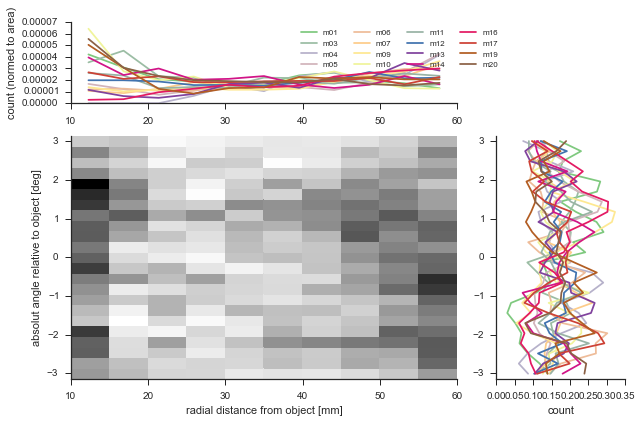

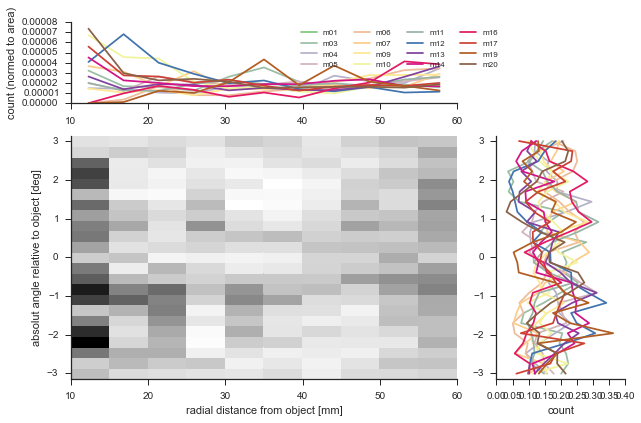

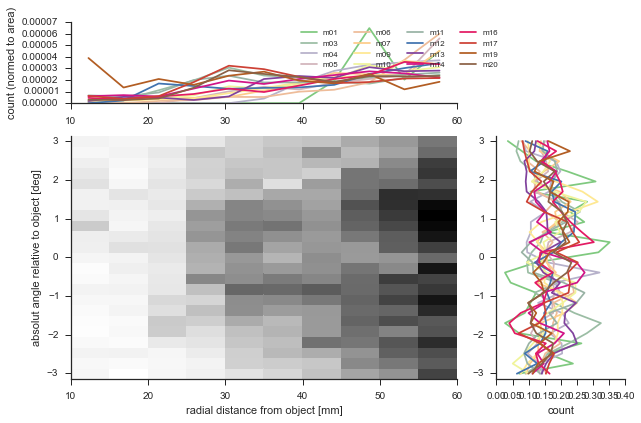

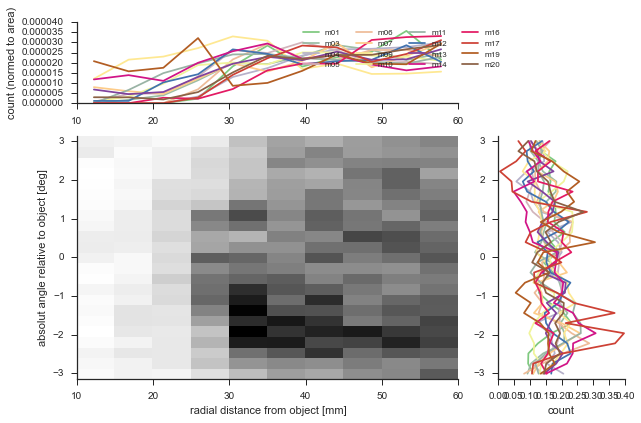

In [141]:
# plot parameter
distBins = 11
angleBins = 24
maxDist = arenaRad
minDist = 10

try:
    mkdir(analysisDir + 'headingVsDistance/')
except:
    print('Plot directory already exists')

# Note: Line plot alphas are proportional to amount of data the respective fly contrinuted
for ttind,trialtype in enumerate(visibilityState):
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray,
                                           objDistMAall,gammaFullall)
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

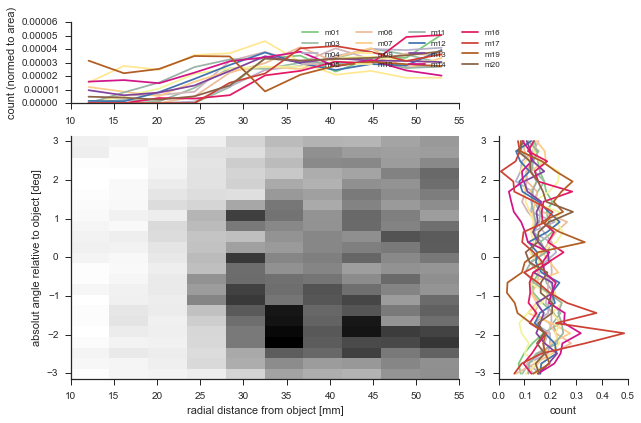

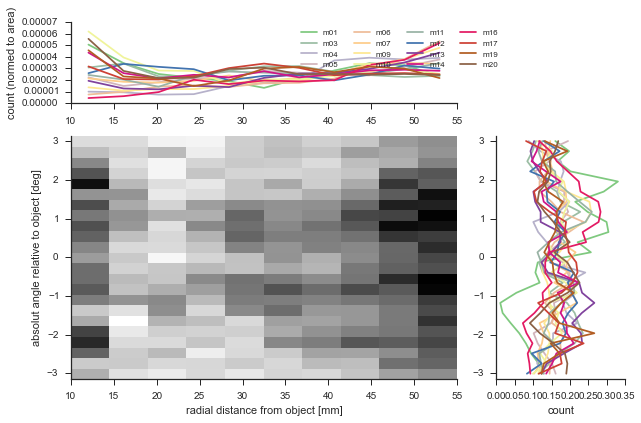

In [142]:
# plot parameter
distBins = 11
angleBins = 24
maxDist = arenaRad-5
minDist = 10

for ttind,trialtype in enumerate(list(set(visibilityState))):
    querystring = '(trialtype == "'+trialtype+'")'+\
        '& (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray,
                                           objDistMAall,gammaFullall)
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

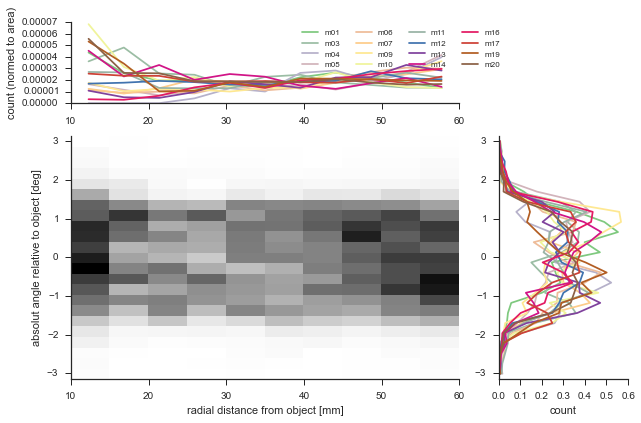

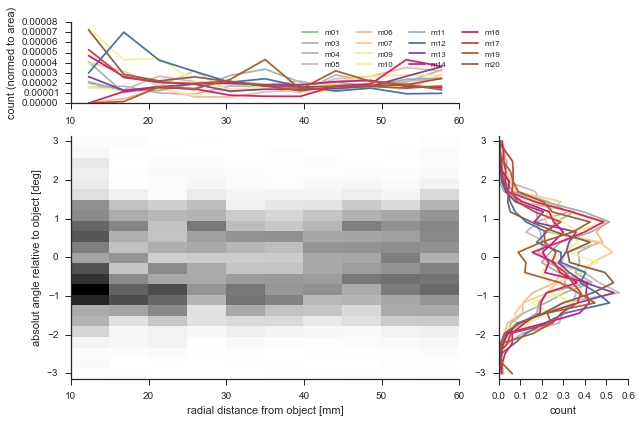

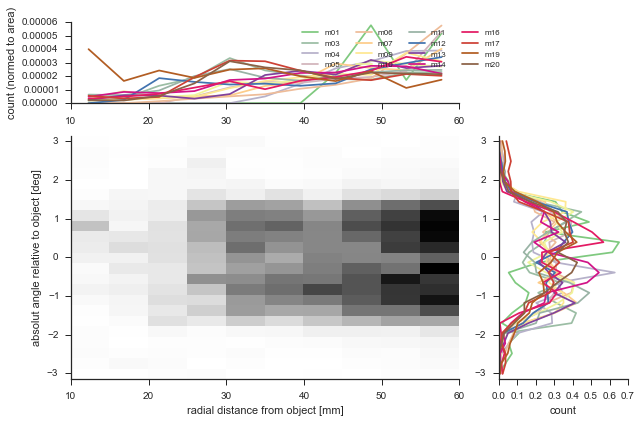

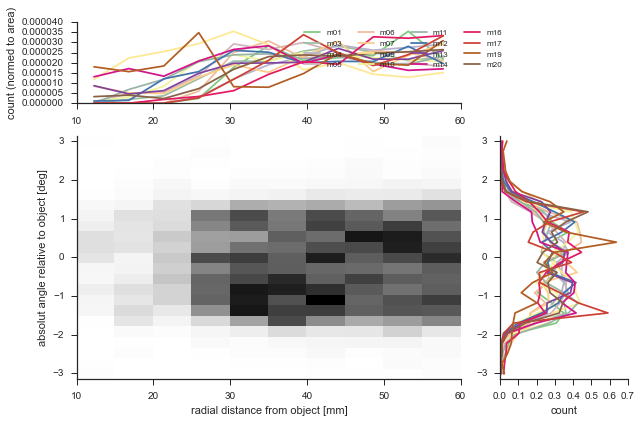

In [143]:
# plot parameter
distBins = 11
angleBins = 24
maxDist = arenaRad
minDist = 10

# Note: Line plot alphas are proportional to amount of data the respective fly contrinuted
for ttind,trialtype in enumerate(visibilityState):
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)
    d_objDist = np.hstack((0, np.diff(np.convolve(objDistMAall, np.ones((7,))/7, mode='same'))))

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray[d_objDist<0],
                                           objDistMAall[d_objDist<0],gammaFullall[d_objDist<0])
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_apr_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

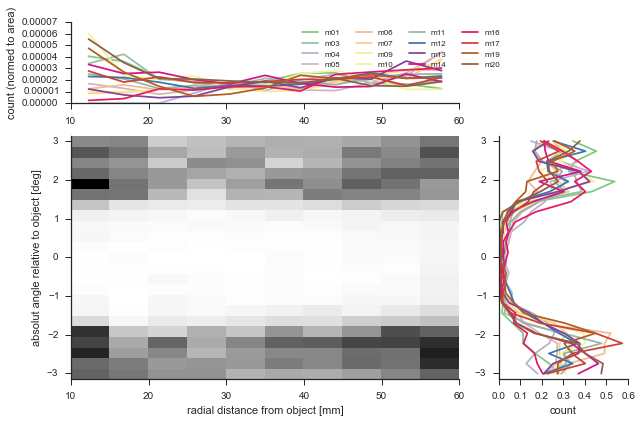

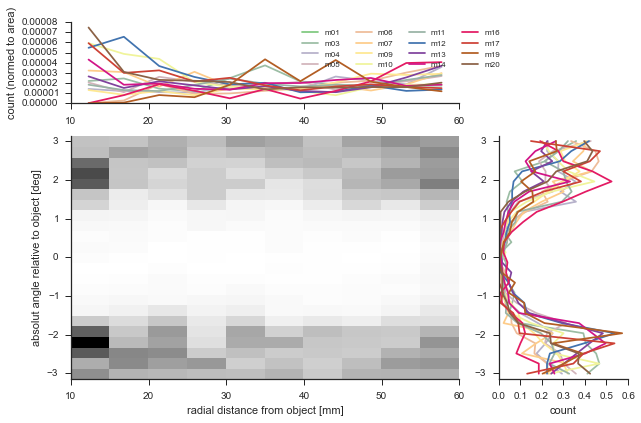

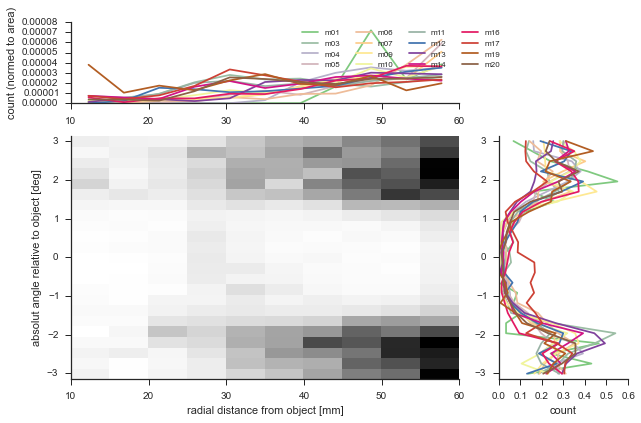

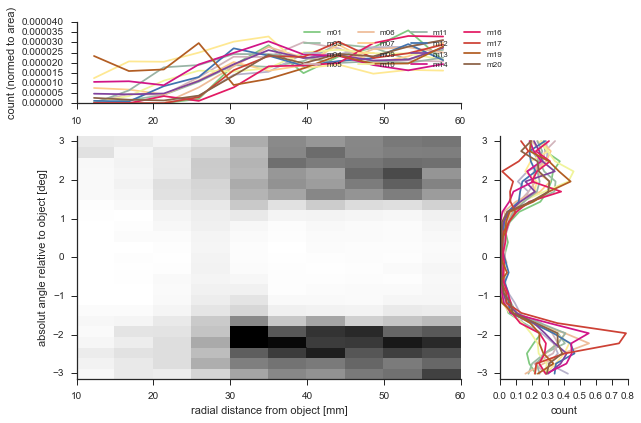

In [144]:
# plot parameter
distBins = 11
angleBins = 24
maxDist = arenaRad
minDist = 10

# Note: Line plot alphas are proportional to amount of data the respective fly contrinuted
for ttind,trialtype in enumerate(visibilityState):
    querystring = '(trialtype == "'+trialtype+'") & (trial == '+str(ttind+1)+\
        ') & (moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<' + str(maxDist) + ')'
    xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
    flyIDallarray = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_fly:keyind_fly+1]).squeeze()
    
    objDistMAall, _ = cartesian2polar(xPosMAall,yPosMAall)
    d_objDist = np.hstack((0, np.diff(np.convolve(objDistMAall, np.ones((7,))/7, mode='same'))))

    headingDistFig = radDistAngleCombiPlot(distBins,angleBins,minDist,maxDist,flyIDs,flyIDallarray[d_objDist>0],
                                           objDistMAall[d_objDist>0],gammaFullall[d_objDist>0])
    
    headingDistFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_' + trialtype
                           + '_headingVsDistanceHist_dep_trial'+ str(ttind+1) +'_n'+ str(len(flyIDs)) +'.pdf',
                           format='pdf')

## Analysis of steering maneuvres and their relationship with the object location

### Turnrate relative to object distance

Plot directory already exists


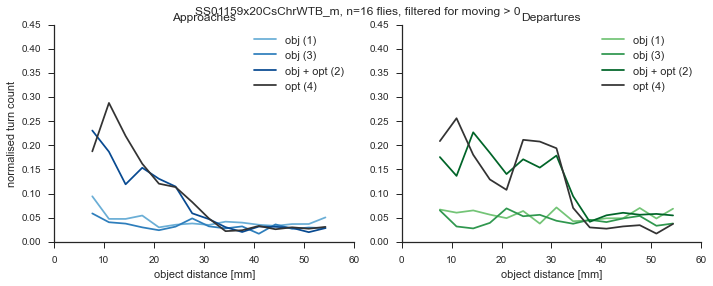

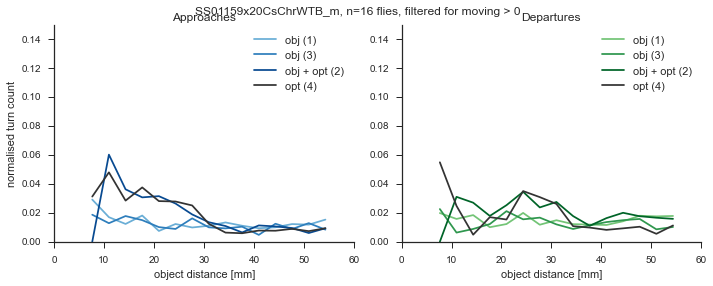

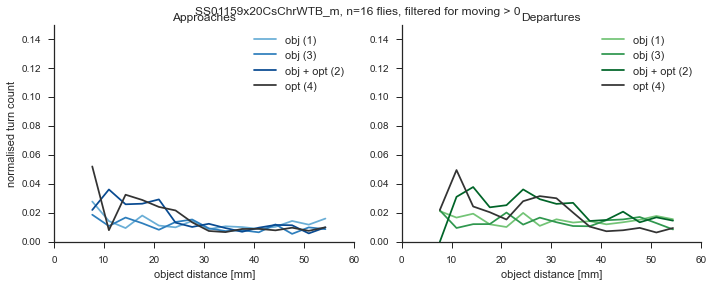

In [145]:
numBins = 15
useTurnIndex = False
movementFilter='moving > 0'

try:
    mkdir(analysisDir + 'turnRates/')
except:
    print('Plot directory already exists')

useTurnChange = 0

Fig = plt.figure(figsize=(10,4))
Fig.suptitle(genotype +'_'+flyIDs[0][0]+', n='+str(numFlies)+' flies, filtered for '+movementFilter , fontsize=12)
yLimRange = (0,0.45)
Fig = turnRatePerDistance(Fig,FOAllFlies_df,keylistLong,visibilityState,movementFilter,useTurnIndex,
                          useTurnChange,trialName,yLimRange,numBins,arenaRad)

Fig.savefig(analysisDir + 'turnRates/'+ genotype +'_'+flyIDs[0][0]+
            '_turnRatePerDistance_aboveTH'+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

useTurnChange = 1

Fig = plt.figure(figsize=(10,4))
Fig.suptitle(genotype +'_'+flyIDs[0][0]+', n='+str(numFlies)+' flies, filtered for '+movementFilter , fontsize=12)
yLimRange = (0,0.15)
Fig = turnRatePerDistance(Fig,FOAllFlies_df,keylistLong,visibilityState,movementFilter,useTurnIndex,
                          useTurnChange,trialName,yLimRange,numBins,arenaRad)

Fig.savefig(analysisDir + 'turnRates/'+ genotype +'_'+flyIDs[0][0]+
            '_turnRatePerDistance_turnStart'+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

useTurnChange = -1

Fig = plt.figure(figsize=(10,4))
Fig.suptitle(genotype +'_'+flyIDs[0][0]+', n='+str(numFlies)+' flies, filtered for '+movementFilter , fontsize=12)
yLimRange = (0,0.15)
Fig = turnRatePerDistance(Fig,FOAllFlies_df,keylistLong,visibilityState,movementFilter,useTurnIndex,
                          useTurnChange,trialName,yLimRange,numBins,arenaRad)

Fig.savefig(analysisDir + 'turnRates/'+ genotype +'_'+flyIDs[0][0]+
            '_turnRatePerDistance_turnEnd'+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

## Polar coord maps of movement parameter

In [146]:
minDist = 6
maxDist = 56
distEdges = np.linspace(minDist, maxDist, 10)
angleEdges = np.linspace(0, np.pi, 9)
fullAngleEdges = np.linspace(-np.pi, np.pi, 36)
maxVals = (12.0,7.0, 1.0, 0.3) #(20.0,10.0, 1.5, 0.3)#

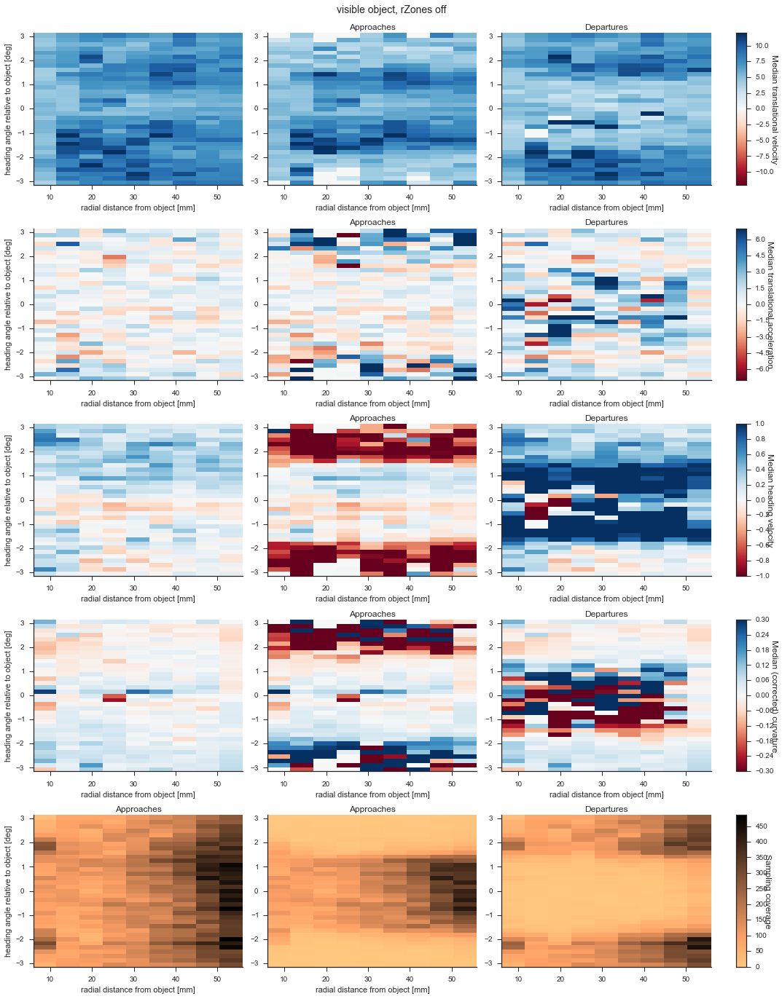

In [147]:
#for tind,trialtype in enumerate(visibilityState):
trial = 1
trialtype = 'visible'
querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, rZones ' + rZoneState[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_'+trialtype+'Objects_rZone'
                      +rZoneState[trial-1]+'_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

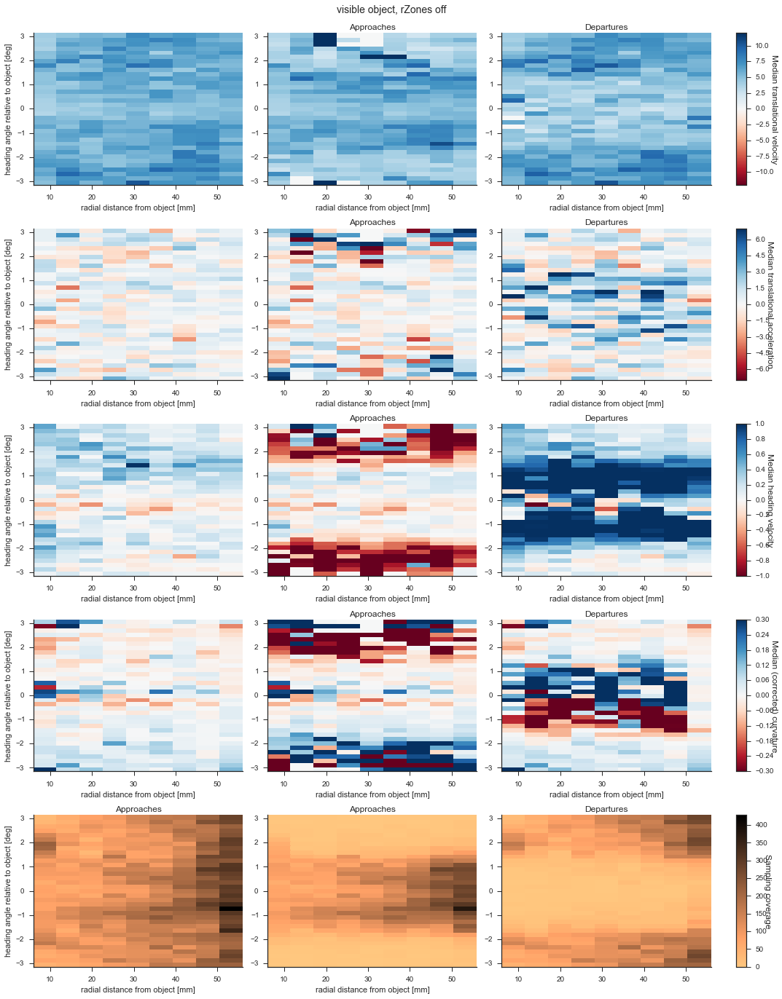

In [148]:
trialtype = 'visible'
trial = 2

querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, rZones ' + rZoneState[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_'+trialtype+'Objects_rZone'
                      +rZoneState[trial-1]+'_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

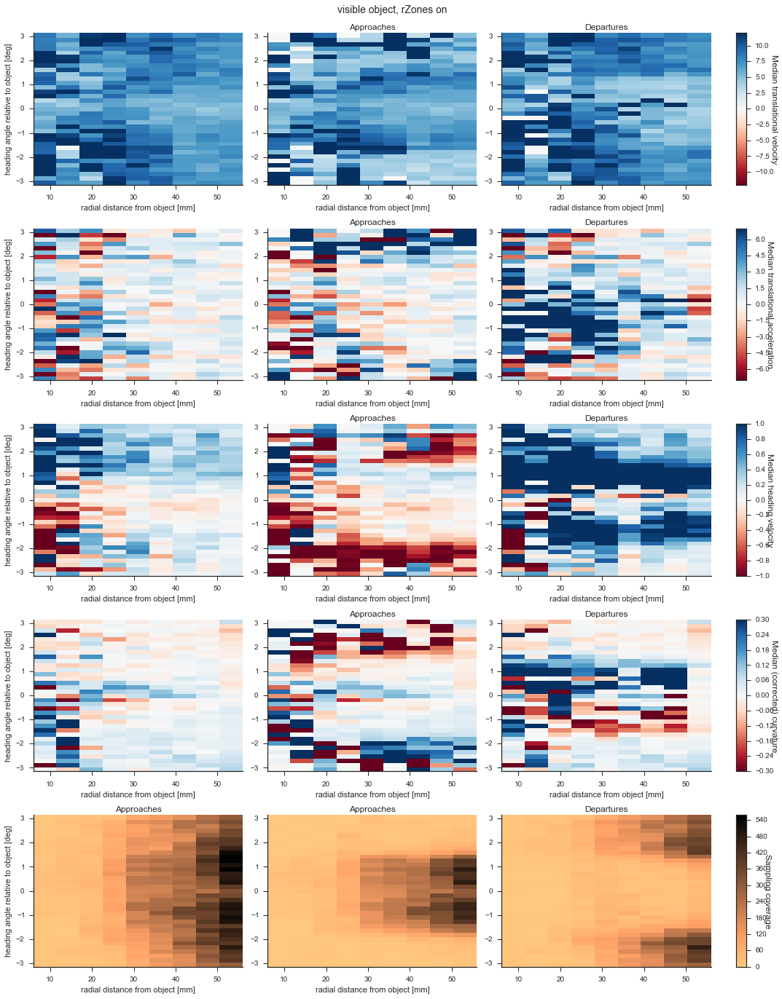

In [149]:
trialtype = 'visible'
trial = 3

querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, rZones ' + rZoneState[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_'+trialtype+'Objects_rZone'
                      +rZoneState[trial-1]+'_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

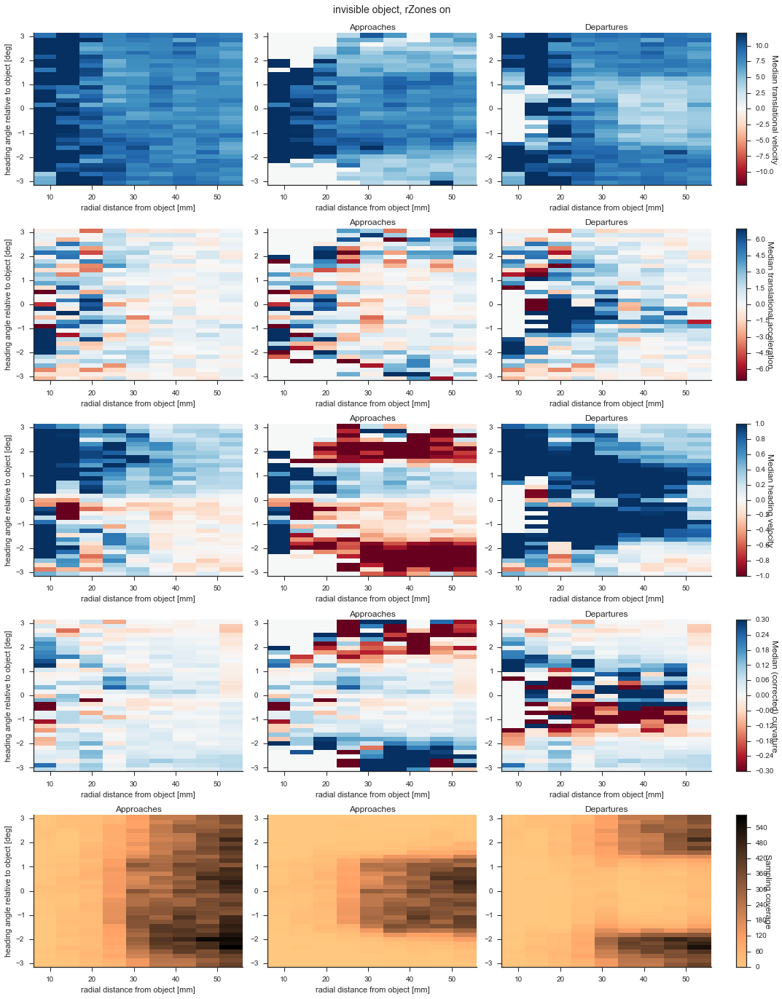

In [150]:
trialtype = 'invisible'
trial = 4

querystring = '(moving > 0) & (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+\
                ') & (trialtype == "'+ trialtype +'") & (trial == '+str(trial)+')' 
xPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosMAall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullall = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
vT = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
time = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()

objDistanceall, thetaall = cartesian2polar(xPosMAall,yPosMAall)
polarCurv, d_theta, dtheta_objDist = polarCurvature(thetaall, objDistanceall)

relPolMeanFig = plt.figure(figsize = (15,20))
relPolMeanFig = make4ValuePolCoordPlot(relPolMeanFig,objDistanceall,gammaall,gammaFullall,vT,polarCurv,
                                       d_theta, time, distEdges,fullAngleEdges,maxVals)
relPolMeanFig.tight_layout()
relPolMeanFig.tight_layout(rect=[0, 0.03, 1, 0.97])
relPolMeanFig.suptitle(trialtype + ' object, rZones ' + rZoneState[trial-1],fontsize=14)

relPolMeanFig.savefig(analysisDir + 'headingVsDistance/'+ genotype +'_'+flyIDs[0][0]+'_'+trialtype+'Objects_rZone'
                      +rZoneState[trial-1]+'_steering_headingVsDistance_trial'+ str(trial) +'_n'+ str(len(flyIDs)) +'.pdf',
                      format='pdf')

### Per-fly comparison between trials

Not enought turns in fly13
Analysis directory already exists.


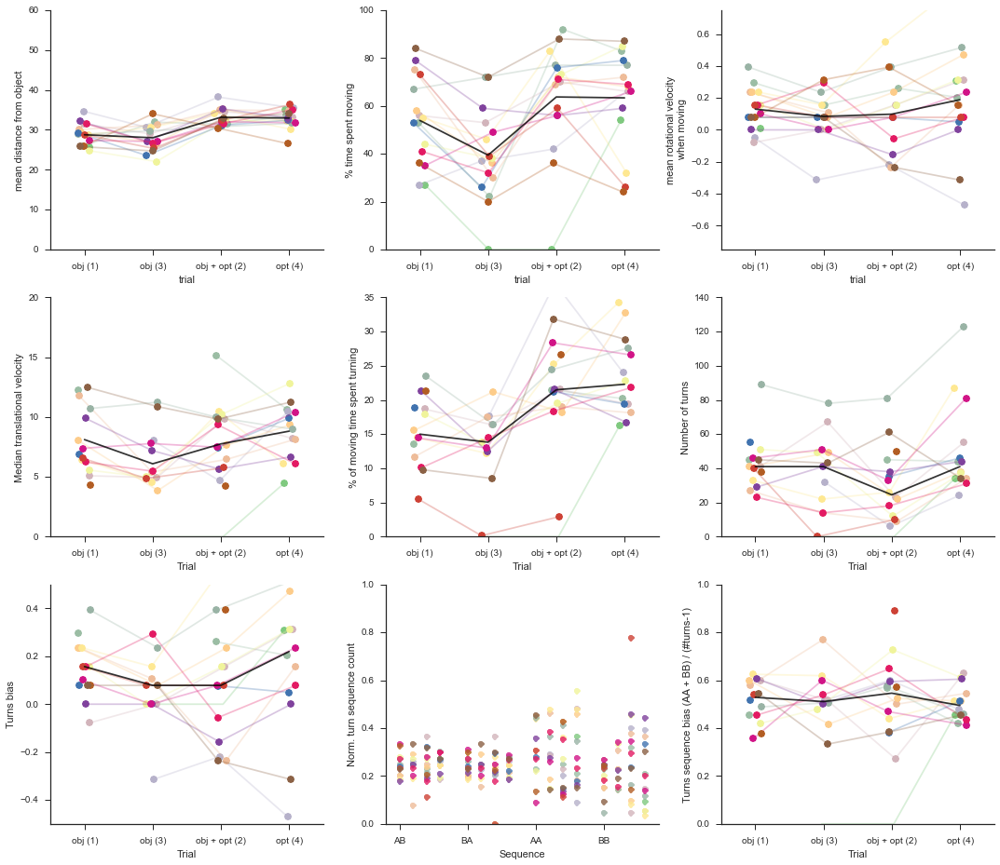

In [153]:
# make fly summary plot of residency:
arenaRad = 60
numtrials = len(visibilityState)
numVItrials = sum(['visible' in visibilityState[trial] for trial in range(len(visibilityState))])
numIVtrials = len(visibilityState)-numVItrials

minTurnDist = 5

minDist = 10
maxDist = 40

trialComparisonFig = plt.figure(figsize=(15,13))
gs = gridspec.GridSpec(3,3) #,width_ratios=[1,0.9])

nTrial = [nTrialsNR/2, nTrialsNR/2,nTrialsR/2, nTrialsIN]

# Top row plots: ...............................................................................................

# Plots of (a) percent of time spent moving, (b) rotational bias and (c) mean distance from object
percentMoving = np.zeros((numFlies,numtrials))
rotationBias = np.zeros((numFlies,numtrials))
meanObjDist = np.zeros((numFlies,numtrials))
jitter = np.zeros((numFlies,numtrials))

perFlyMeanDistPlt = trialComparisonFig.add_subplot(gs[0,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[0,1])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyRotBiasPlt = trialComparisonFig.add_subplot(gs[0,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')


for fly in range(numFlies):
    for trial in range(numtrials):

        tJitter = np.random.uniform(-0.1, 0.1)
        jitter[fly,trial] = tJitter
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +'")'\
                        +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                       +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float')
        perFlyObjDist = FOAllFlies_df.query(querystring).iloc[:,keyind_objD:keyind_objD+1].squeeze().astype('float')
        
        percentMoving[fly,trial] = 100*sum(perFlyMoving)/max(1,len(perFlyMoving))
        rotationBias[fly,trial] = np.nanmedian(perFlyRot)
        meanObjDist[fly,trial] = np.nanmedian(perFlyObjDist)
        
        perFlyMovingPlt.plot(trial+1+tJitter,percentMoving[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))

        perFlyRotBiasPlt.plot(trial+1+tJitter,rotationBias[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))
        
        perFlyMeanDistPlt.plot(trial+1+tJitter,meanObjDist[fly,trial],'.',markersize=15,color=flyCMap.to_rgba(fly))
        
        
    perFlyMovingPlt.plot(range(1,numtrials+1)+jitter[fly,:],percentMoving[fly,:],
                         '-',markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    
    perFlyRotBiasPlt.plot(range(1,numtrials+1)+jitter[fly,:] ,rotationBias[fly,:],'-',
                          markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
        
    perFlyMeanDistPlt.plot(range(1,numtrials+1)+jitter[fly,:],meanObjDist[fly,:],'-',
                         markersize=15, color=flyCMap.to_rgba(fly), alpha=0.3)
    
    
#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyRotBiasPlt.plot(range(1,numtrials+1),np.nanmean(rotationBias,axis=0),color='k',alpha=0.8)
perFlyMeanDistPlt.plot(range(1,numtrials+1),np.nanmean(meanObjDist,axis=0),color='k',alpha=0.8)

# Beautify axes
perFlyMeanDistPlt.set_ylim(0,arenaRad)
perFlyMeanDistPlt.set_xlim(0.5,numtrials+0.5)
perFlyMeanDistPlt.set_xlabel('trial')
perFlyMeanDistPlt.set_ylabel('mean distance from object')
myAxisTheme(perFlyMeanDistPlt)

perFlyMovingPlt.set_ylim(0,100)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('trial')
perFlyMovingPlt.set_ylabel('% time spent moving')
myAxisTheme(perFlyMovingPlt)

perFlyRotBiasPlt.set_ylim(-0.75,0.75)
perFlyRotBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyRotBiasPlt.set_xlabel('trial')
perFlyRotBiasPlt.set_ylabel('mean rotational velocity \n when moving')
myAxisTheme(perFlyRotBiasPlt)

# Bottom row plots: ...............................................................................................

# Only include moving flies
querystring = '(moving > 0)'
vRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
time = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

# Find turnTH over all flies
vRot_filt = np.convolve(vRot, np.ones((5,))/5, mode='same')
turnTH_pos = 2*np.std(vRot_filt[vRot_filt>=0])
turnTH_neg = -2*np.std(vRot_filt[vRot_filt<=0])

percentMoving = np.zeros((numFlies,numtrials))
perFlyTurnTH = np.zeros((numFlies,numtrials))
perFlyNumTurn = np.zeros((numFlies,numtrials))
perFlyTurnDir = np.zeros((numFlies,numtrials))
perFlyTurnSeqBias = np.zeros((numFlies,numtrials))

randJitter = np.zeros((numFlies,numtrials))

perFlyMovingPlt = trialComparisonFig.add_subplot(gs[1,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyTurnTHPlt = trialComparisonFig.add_subplot(gs[1,1])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyNumTurnPlt = trialComparisonFig.add_subplot(gs[1,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

perFlyTurnDirPlt = trialComparisonFig.add_subplot(gs[2,0])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')
perFlyTurnSeqPlt = trialComparisonFig.add_subplot(gs[2,1])
plt.xticks([0,1,2,3],['AB','BA','AA','BB'])
perFlyTurnSeqBiasPlt = trialComparisonFig.add_subplot(gs[2,2])
plt.xticks([1,2,3,4],trialName, rotation='horizontal')

for fly in range(numFlies):
    for trial in range(numtrials):
        
        jitter = np.random.uniform(-0.1, 0.1)
        randJitter[fly,trial] = jitter
        
        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '")'\
                      +'& (objectDistance>'+str(minDist)+') & (objectDistance<'+str(maxDist)+')'
        perFlyMoving = FOAllFlies_df.query(querystring).iloc[:,keyind_mov:keyind_mov+1].squeeze().astype('bool')
        
        if perFlyMoving.size < 5:
            continue
            
        if (100.0*sum(perFlyMoving))/max(1,len(perFlyMoving)) < 30:
            percentMoving[fly,trial] = np.nan
            perFlyTurnTH[fly,trial] = np.nan
            perFlyNumTurn[fly,trial] = np.nan
            perFlyTurnDir[fly,trial] = np.nan
            perFlyTurnSeqBias[fly,trial] = np.nan
            continue

        querystring = '(trial == ' + str(trial+1) + ') & (flyID == "'+ flyIDs[fly] +  '") & (moving > 0)'\
                      +'& (objectDistance >='+str(minDist)+') & (objectDistance <='+str(maxDist)+')'
        perFlyTra = FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1].squeeze().astype('float').values
        perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
        
        perFlyRot_filt = np.convolve(perFlyRot, np.ones((5,))/5, mode='same')
        
        turnMask = np.logical_or(perFlyRot_filt>turnTH_pos,perFlyRot_filt<turnTH_neg)
        turnLoc = np.where(turnMask>0)[0]
        turnStart = turnLoc[np.where(np.hstack((0,np.diff(turnLoc)))>minTurnDist)[0]]
        turnSide = np.sign(perFlyRot[turnStart])
        
        try:
            turnSeq = np.zeros(len(turnStart)-1)
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==0.5)[0]] = 2
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-0.5)[0]] = 3
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-1.5)[0]] = 0
            turnSeq[np.where(((np.diff(turnSide)+0.5)*turnSide[:-1])==-2.5)[0]] = 1
            
            numBin = 4
            [n,edgs] = np.histogram(turnSeq,bins=numBin)
        
        except ValueError:
            print('Not enought turns in fly' + str(fly))
            n = np.ones(numBin)*np.nan
            
        perFlyTurnTH[fly,trial] = 100.0*(sum(perFlyRot_filt>turnTH_pos) + sum(perFlyRot_filt<turnTH_neg))/max(1,len(perFlyRot_filt))
        perFlyNumTurn[fly,trial] = len(turnStart)
        perFlyTurnDir[fly,trial] = np.nanmedian(perFlyRot)
        #abs((1.0*sum(perFlyRot_filt>turnTH_pos) - sum(perFlyRot_filt<turnTH_neg))/
        #                               max(1.0*sum(perFlyRot_filt>turnTH_pos) + sum(perFlyRot_filt<turnTH_neg),1))
        if sum(n)==0:
            perFlyTurnSeqBias[fly,trial] = np.nan
        else:
            perFlyTurnSeqBias[fly,trial] = float(sum(n[2:]))/sum(n)
        
        alphaVal = min(perFlyNumTurn[fly,trial]/3,1)
        
        percentMoving[fly,trial] = np.nanmedian(perFlyTra)
        
        perFlyMovingPlt.plot(trial+1+jitter,percentMoving[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        
        perFlyTurnTHPlt.plot(trial+1+jitter,perFlyTurnTH[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        perFlyNumTurnPlt.plot(trial+1+jitter,perFlyNumTurn[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        perFlyTurnDirPlt.plot(trial+1+jitter,perFlyTurnDir[fly,trial],'.',
                              markersize=15,color = flyCMap.to_rgba(fly))
        
        perFlyTurnSeqPlt.plot(range(numBin)+np.ones(numBin)*0.2*trial,n/(np.ones(numBin)*sum(n)),
                              marker = 'o',linestyle='none',alpha = 0.8,color = flyCMap.to_rgba(fly))
        
        perFlyTurnSeqBiasPlt.plot(trial+1+jitter,perFlyTurnSeqBias[fly,trial],'.',
                             markersize=15,color = flyCMap.to_rgba(fly))
        
    perFlyMovingPlt.plot(range(1,numtrials+1)+randJitter[fly,:],percentMoving[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)    
    perFlyTurnTHPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnTH[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyNumTurnPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyNumTurn[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyTurnDirPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnDir[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1)+randJitter[fly,:],perFlyTurnSeqBias[fly,:],'-',
                         markersize=15,color = flyCMap.to_rgba(fly), alpha=0.3)
    
#plot average response
perFlyMovingPlt.plot(range(1,numtrials+1),np.nanmean(percentMoving,axis=0),color='k',alpha=0.8)
perFlyTurnTHPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnTH,axis=0),color='k',alpha=0.8)
perFlyNumTurnPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyNumTurn,axis=0),color='k',alpha=0.8)
perFlyTurnDirPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnDir,axis=0),color='k',alpha=0.8)
perFlyTurnSeqBiasPlt.plot(range(1,numtrials+1),np.nanmedian(perFlyTurnSeqBias,axis=0),color='k',alpha=0.8)

# Beautify axes
perFlyMovingPlt.set_ylim(0,20)
perFlyMovingPlt.set_xlim(0.5,numtrials+0.5)
perFlyMovingPlt.set_xlabel('Trial')
perFlyMovingPlt.set_ylabel('Median translational velocity')
myAxisTheme(perFlyMovingPlt)

perFlyTurnTHPlt.set_ylim(0,35)
perFlyTurnTHPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnTHPlt.set_xlabel('Trial')
perFlyTurnTHPlt.set_ylabel('% of moving time spent turning')
myAxisTheme(perFlyTurnTHPlt)

perFlyNumTurnPlt.set_xlim(0.5,numtrials+0.5)
perFlyNumTurnPlt.set_xlabel('Trial')
perFlyNumTurnPlt.set_ylabel('Number of turns')
myAxisTheme(perFlyNumTurnPlt)

perFlyTurnDirPlt.set_ylim(-0.5,0.5)
perFlyTurnDirPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnDirPlt.set_xlabel('Trial')
perFlyTurnDirPlt.set_ylabel('Turns bias')
myAxisTheme(perFlyTurnDirPlt)

perFlyTurnSeqPlt.set_ylim(0,1)
perFlyTurnSeqPlt.set_xlim(-0.2,numBin-0.2)
perFlyTurnSeqPlt.set_xlabel('Sequence')
perFlyTurnSeqPlt.set_ylabel('Norm. turn sequence count')
myAxisTheme(perFlyTurnSeqPlt)

perFlyTurnSeqBiasPlt.set_ylim(0,1)
perFlyTurnSeqBiasPlt.set_xlim(0.5,numtrials+0.5)
perFlyTurnSeqBiasPlt.set_xlabel('Trial')
perFlyTurnSeqBiasPlt.set_ylabel('Turns sequence bias (AA + BB) / (#turns-1)')
myAxisTheme(perFlyTurnSeqBiasPlt)

trialComparisonFig.tight_layout()

try:
    mkdir(analysisDir + sep + 'compareAllTrials' + sep)
except OSError:
    print('Analysis directory already exists.')

trialComparisonFig.savefig(analysisDir+'compareAllTrials/'+genotype+'_'+flyIDs[0][0]
                   +'_allTrials_'+str(minDist)+'-'+str(maxDist)+'_n'+str(len(flyIDs))+'.pdf', format='pdf')

## Characterise turns at border or rZone

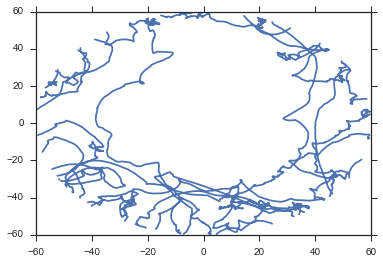

In [36]:
fly = 3
querystring = '(moving > 0) & (flyID=="m03") & (trial==3)'
perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values
perFlyH = FOAllFlies_df.query(querystring).iloc[:,keyind_ang:keyind_ang+1].squeeze().astype('float').values
perFlyG = FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1].squeeze().astype('float').values
perFlytime = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

plt.plot(perFlyX, perFlyY)

NameError: name 'entries' is not defined

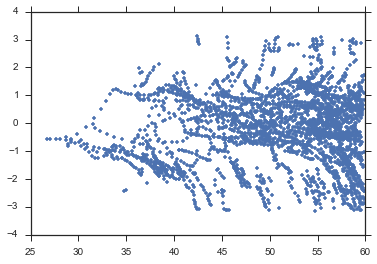

In [37]:
perFlyObjDist, perFlyTheta = cartesian2polar(perFlyX,perFlyY)
perFlyObjDist_d = np.hstack((0,np.diff(perFlyObjDist)))
plt.plot(perFlyObjDist[perFlyObjDist_d<0], perFlyG[perFlyObjDist_d<0],'.')
plt.plot(perFlyObjDist[entries], perFlyG[entries],'ro')

In [ ]:
entryRad = 40
perFlyEntry = perFlyObjDist-entryRad
nanmask = ~np.isnan(perFlyEntry)

zero_crossings = np.hstack((0,np.diff(np.sign(perFlyEntry[nanmask]))>0))
#zero_crossings = np.where(np.diff(np.signbit(perFlyEntry)))[0]
entries = np.logical_and(zero_crossings[nanmask], perFlyObjDist_d[nanmask]<0)

plt.plot(perFlytime[nanmask],perFlyEntry[nanmask])
plt.plot(perFlytime[perFlytime][zero_crossings],perFlyEntry[perFlytime][zero_crossings],'r.')

In [ ]:
# Possible other metrics to look at:
#   -  locations of turns


In [44]:
fly = 5
querystring = '(moving > 0)'
perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
perFlytime = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values

perFlyRot_filt = np.convolve(perFlyRot, np.ones((5,))/5, mode='same')

turnTH_pos = 2*np.std(perFlyRot_filt[perFlyRot_filt>=0])
turnTH_neg = -2*np.std(perFlyRot_filt[perFlyRot_filt<=0])

querystring = '(flyID == "' + flyIDs[fly] + '") & (trial == ' + str(2) + ') & (moving > 0)'
perFlyRot = FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1].squeeze().astype('float').values
perFlytime = FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1].squeeze().astype('float').values
perFlyRot_filt = np.convolve(perFlyRot, np.ones((5,))/5, mode='same')

turnMask = np.logical_or(perFlyRot_filt>turnTH_pos,perFlyRot_filt<turnTH_neg)
turnMask_right = perFlyRot_filt<turnTH_neg
turnMask_left = perFlyRot_filt>turnTH_pos

In [45]:
# find sharp turn starts
minTurnDist = 5

turnLoc = np.where(turnMask>0)[0]
turnStart = turnLoc[np.where(np.hstack((0,np.diff(turnLoc)))>minTurnDist)[0]]

turnLocL = np.where(turnMask_left>0)[0]
turnStartL = turnLocL[np.where(np.hstack((0,np.diff(turnLocL)))>minTurnDist)[0]]

turnLocR = np.where(turnMask_right>0)[0]
turnStartR = turnLocR[np.where(np.hstack((0,np.diff(turnLocR)))>minTurnDist)[0]]

turnSide = np.sign(perFlyRot[turnStart])

30


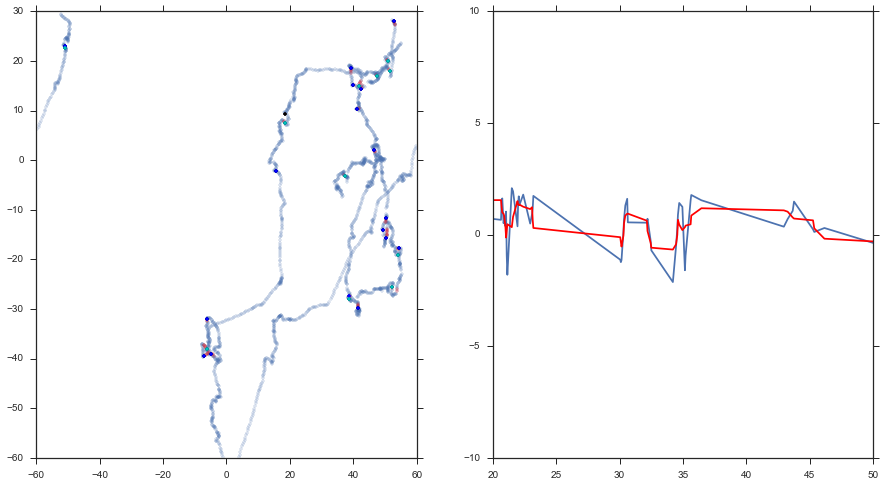

In [46]:
# Visualise detected turns
perFlyX = FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1].squeeze().astype('float').values
perFlyY = FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1].squeeze().astype('float').values

fig = plt.figure(figsize=(15,8))
fig.add_subplot(121)
plt.plot(perFlyX,perFlyY,'.',alpha=0.2)
plt.plot(perFlyX[turnMask],perFlyY[turnMask],'r.',alpha=0.2)
plt.plot(perFlyX[turnStart],perFlyY[turnStart],'k.')
plt.plot(perFlyX[turnStartL],perFlyY[turnStartL],'b.')
plt.plot(perFlyX[turnStartR],perFlyY[turnStartR],'c.')

fig.add_subplot(122)
plt.plot(perFlytime,perFlyRot)
plt.plot(perFlytime,perFlyRot_filt,'r')
plt.plot(perFlytime[perFlyRot_filt>turnTH_pos],perFlyRot[perFlyRot_filt>turnTH_pos],'r.')
plt.plot(perFlytime[perFlyRot_filt<turnTH_neg],perFlyRot[perFlyRot_filt<turnTH_neg],'r.')
plt.plot(perFlytime[turnStart],perFlyRot[turnStart],'c.')
plt.plot(perFlytime[turnStart],turnSide*5,'ko')
plt.xlim((20,50))
plt.ylim((-10,10))

print(len(turnStart))

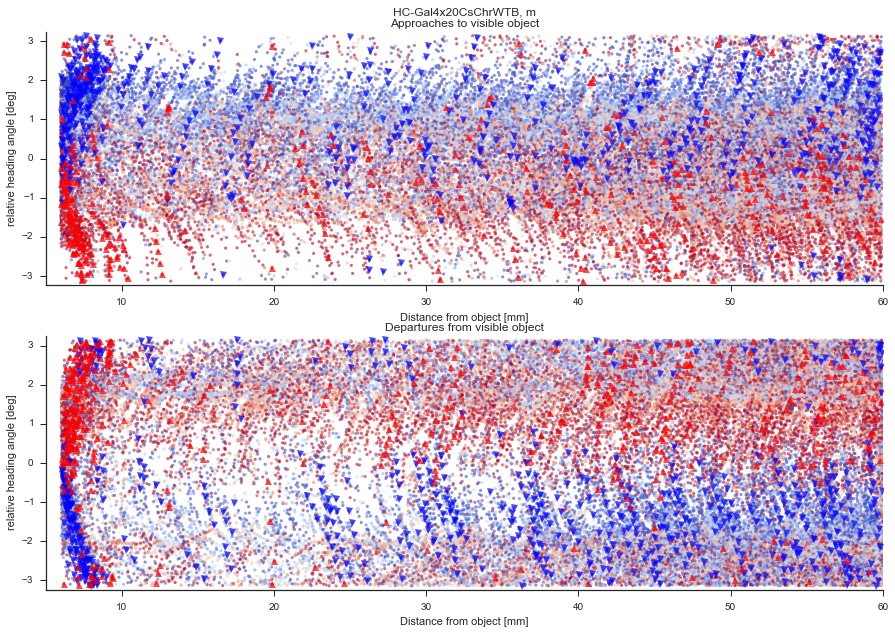

In [47]:
from trajectoryDerivedParams import cartesian2polar, polarCurvature
from flyTracePlots import plotPolarTrace
from scipy.ndimage.filters import gaussian_filter

condition = "visible"
rZone = "off"
querystring = \
 '(reinforcement=="'+rZone+'") & (trialtype=="'+condition+'")&(moving>0)&(objectDistance>6)'
xPosFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
angleFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_ang:keyind_ang+1]).squeeze()
timeFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()
vTransFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
vRotFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1]).squeeze()


# Find turnTH over all flies
useTurnIndex = False
if useTurnIndex:
    vtrans = np.asarray(FOAllFlies_df.query(querystring).iloc[:, keyind_vT:keyind_vT+1]).squeeze()
    vRotFilt_ds = np.convolve(vRotFly/vTransFly, np.ones((5,))/5, mode='same')
    vRotFilt_ds[np.isinf(abs(vRotFilt_ds))] = 0.0
else:
    vRotFilt_ds = np.convolve(vRotFly, np.ones((5,))/5, mode='same')

turnTH_pos = 2*np.nanstd(vRotFilt_ds[vRotFilt_ds >= 0])
turnTH_neg = -2*np.nanstd(vRotFilt_ds[vRotFilt_ds <= 0])
turnTH = 2*np.nanstd(abs(vRotFilt_ds))

# transform trajectory to polar coordinates
objDist,theta = cartesian2polar(xPosFly,yPosFly)

# compute curvature
polarCurv, d_theta, dtheta_objDist = polarCurvature(theta,objDist)

d_objDist = np.hstack((0, np.diff(objDist)))

# Compute sign of turn relative to object
turnSign = np.sign(polarCurv)
turnSign[d_theta>0] = np.sign(polarCurv[d_theta>0])
turnSign[d_theta<0] = -np.sign(polarCurv[d_theta<0])

# Compute curvature-based criterion for turns
q2, q98 = np.percentile(polarCurv[~np.isnan(polarCurv)], [2 ,98])
curvSelect = abs(polarCurv)< (q98 - q2)/2

curvTurnMask_L = polarCurv > q98
curvTurnMask_R = polarCurv < q2

# Generate filtered curvature for plots and curvature magnitude
polarCurvPlt = polarCurv[curvSelect]

curvMag = abs(polarCurv)


selectPts_apr = d_objDist<0
selectPts_dep = d_objDist>0

selectPts_apr_turnR = np.logical_and(selectPts_apr,vRotFilt_ds < -2*turnTH)
selectPts_apr_turnL = np.logical_and(selectPts_apr,vRotFilt_ds > 2*turnTH)
selectPts_dep_turnR = np.logical_and(selectPts_dep,vRotFilt_ds < -2*turnTH)
selectPts_dep_turnL = np.logical_and(selectPts_dep,vRotFilt_ds > 2*turnTH)

fig = plt.figure(figsize=(15,10))

xlimRange = (5,60)
d_objDist = np.hstack((0, np.diff(objDist)))

ax=fig.add_subplot(211)
ax = plotPolarTrace(ax,genotype+', '+flyIDs[0][0] + '\nApproaches to ' + condition + ' object',
                selectPts_apr,selectPts_apr_turnR,selectPts_apr_turnL,objDist,gammaFullFly,vRotFly,xlimRange)

ax=fig.add_subplot(212)
ax = plotPolarTrace(ax,'Departures from '+ condition + ' object',
                selectPts_dep,selectPts_dep_turnR,selectPts_dep_turnL,objDist,gammaFullFly,vRotFly,xlimRange)


In [48]:
makeNestedPlotDirectory(analysisDir, 'polarTrace/', 'rZones_'+ rZones + sep)

fig.savefig(analysisDir + 'polarTrace/rZones_'+ rZones+sep +genotype+'_'+flyIDs[0][0]
            +condition+'Objects_rZones'+rZones+'_polarTrace'+'_n'+ str(len(flyIDs))+'.pdf', format='pdf')

Analysis directory already exists.
Plot directory already exists.


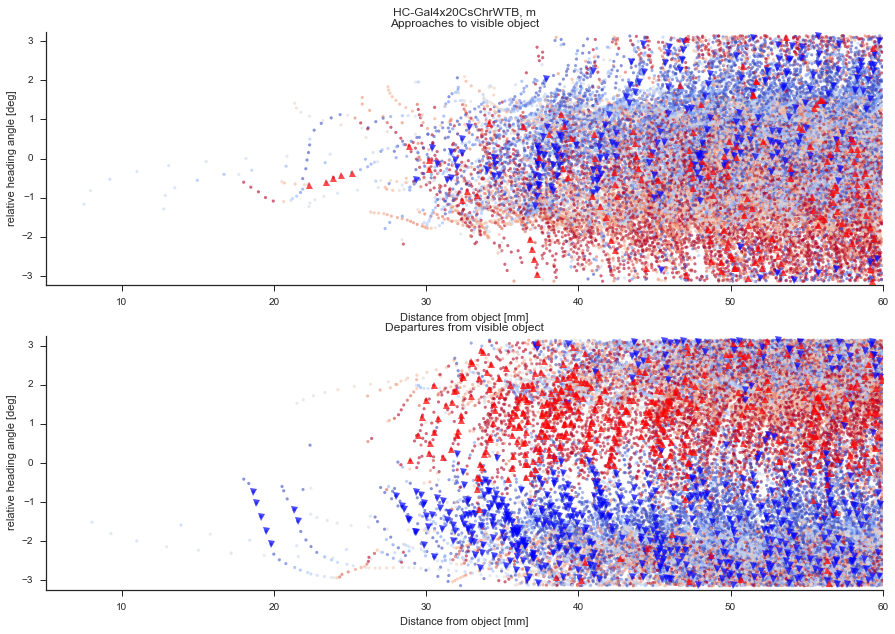

In [49]:
condition = "visible"
rZone = "on"
querystring = \
 '(reinforcement=="'+rZone+'") & (trialtype=="'+condition+'")&(moving>0)&(objectDistance>5.5)'
xPosFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
angleFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_ang:keyind_ang+1]).squeeze()
timeFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()
vTransFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
vRotFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1]).squeeze()


N = 5
vRotFilt_ds = np.convolve(vRotFly, np.ones((N,))/N, mode='same')

# transform trajectory to polar coordinates
objDist,theta = cartesian2polar(xPosFly,yPosFly)

# compute curvature
polarCurv, d_theta, dtheta_objDist = polarCurvature(theta,objDist)

d_objDist = np.hstack((0, np.diff(objDist)))

# Compute sign of turn relative to object
turnSign = np.sign(polarCurv)
turnSign[d_theta>0] = np.sign(polarCurv[d_theta>0])
turnSign[d_theta<0] = -np.sign(polarCurv[d_theta<0])

# Compute curvature-based criterion for turns
q2, q98 = np.percentile(polarCurv[~np.isnan(polarCurv)], [2 ,98])
curvSelect = abs(polarCurv)< (q98 - q2)/2

curvTurnMask_L = polarCurv > q98
curvTurnMask_R = polarCurv < q2

# Generate filtered curvature for plots and curvature magnitude
polarCurvPlt = polarCurv[curvSelect]

curvMag = abs(polarCurv)


selectPts_apr = d_objDist<0
selectPts_dep = d_objDist>0

selectPts_apr_turnR = np.logical_and(selectPts_apr,vRotFilt_ds < -2*turnTH)
selectPts_apr_turnL = np.logical_and(selectPts_apr,vRotFilt_ds > 2*turnTH)
selectPts_dep_turnR = np.logical_and(selectPts_dep,vRotFilt_ds < -2*turnTH)
selectPts_dep_turnL = np.logical_and(selectPts_dep,vRotFilt_ds > 2*turnTH)

fig = plt.figure(figsize=(15,10))

xlimRange = (5,60)
d_objDist = np.hstack((0, np.diff(objDist)))

ax=fig.add_subplot(211)
ax = plotPolarTrace(ax,genotype+', '+flyIDs[0][0] + '\nApproaches to ' + condition + ' object',
                selectPts_apr,selectPts_apr_turnR,selectPts_apr_turnL,objDist,gammaFullFly,vRotFly,xlimRange)

ax=fig.add_subplot(212)
ax = plotPolarTrace(ax,'Departures from '+ condition + ' object',
                selectPts_dep,selectPts_dep_turnR,selectPts_dep_turnL,objDist,gammaFullFly,vRotFly,xlimRange)

In [50]:
makeNestedPlotDirectory(analysisDir, 'polarTrace/', 'rZones_'+ rZones + sep)

fig.savefig(analysisDir + 'polarTrace/rZones_'+ rZones+sep +genotype+'_'+flyIDs[0][0]
            +condition+'Objects_rZones'+rZones+'_polarTrace'+'_n'+ str(len(flyIDs))+'.pdf', format='pdf')

Analysis directory already exists.
Plot directory already exists.


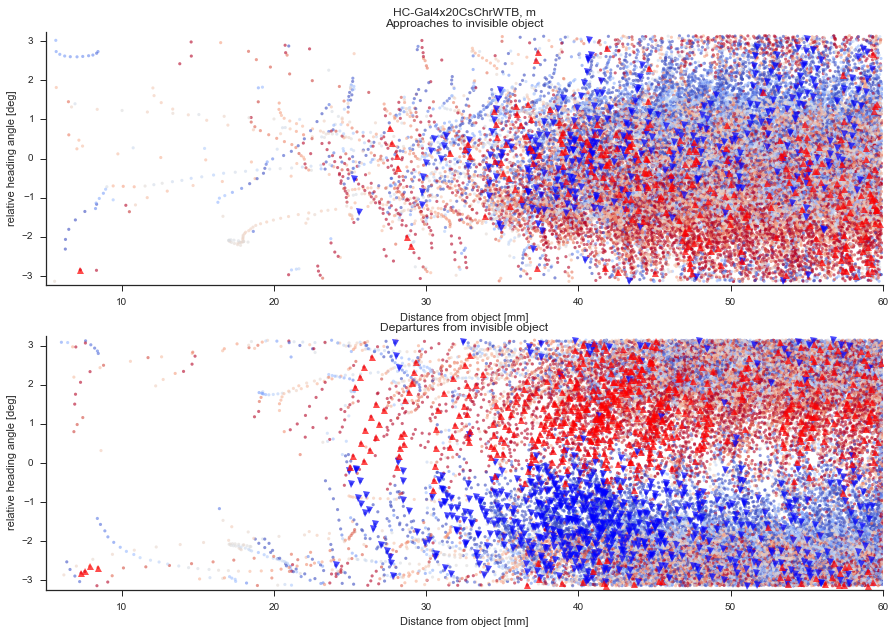

In [51]:
condition = "invisible"
rZone = "on"
querystring = \
 '(reinforcement=="'+rZone+'") & (trialtype=="'+condition+'")&(moving>0)&(objectDistance>5.5)'
xPosFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
yPosFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
gammaFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gam:keyind_gam+1]).squeeze()
gammaFullFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_gamful:keyind_gamful+1]).squeeze()
angleFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_ang:keyind_ang+1]).squeeze()
timeFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_t:keyind_t+1]).squeeze()
vTransFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vT:keyind_vT+1]).squeeze()
vRotFly = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_vR:keyind_vR+1]).squeeze()


N = 5
vRotFilt_ds = np.convolve(vRotFly, np.ones((N,))/N, mode='same')

# transform trajectory to polar coordinates
objDist,theta = cartesian2polar(xPosFly,yPosFly)

# compute curvature
polarCurv, d_theta, dtheta_objDist = polarCurvature(theta,objDist)

d_objDist = np.hstack((0, np.diff(objDist)))

# Compute sign of turn relative to object
turnSign = np.sign(polarCurv)
turnSign[d_theta>0] = np.sign(polarCurv[d_theta>0])
turnSign[d_theta<0] = -np.sign(polarCurv[d_theta<0])

# Compute curvature-based criterion for turns
q2, q98 = np.percentile(polarCurv[~np.isnan(polarCurv)], [2 ,98])
curvSelect = abs(polarCurv)< (q98 - q2)/2

curvTurnMask_L = polarCurv > q98
curvTurnMask_R = polarCurv < q2

# Generate filtered curvature for plots and curvature magnitude
polarCurvPlt = polarCurv[curvSelect]

curvMag = abs(polarCurv)


selectPts_apr = d_objDist<0
selectPts_dep = d_objDist>0

selectPts_apr_turnR = np.logical_and(selectPts_apr,vRotFilt_ds < -2*turnTH)
selectPts_apr_turnL = np.logical_and(selectPts_apr,vRotFilt_ds > 2*turnTH)
selectPts_dep_turnR = np.logical_and(selectPts_dep,vRotFilt_ds < -2*turnTH)
selectPts_dep_turnL = np.logical_and(selectPts_dep,vRotFilt_ds > 2*turnTH)

fig = plt.figure(figsize=(15,10))

xlimRange = (5,60)
d_objDist = np.hstack((0, np.diff(objDist)))

ax=fig.add_subplot(211)
ax = plotPolarTrace(ax,genotype+', '+flyIDs[0][0] + '\nApproaches to ' + condition + ' object',
                selectPts_apr,selectPts_apr_turnR,selectPts_apr_turnL,objDist,gammaFullFly,vRotFly,xlimRange)

ax=fig.add_subplot(212)
ax = plotPolarTrace(ax,'Departures from '+ condition + ' object',
                selectPts_dep,selectPts_dep_turnR,selectPts_dep_turnL,objDist,gammaFullFly,vRotFly,xlimRange)

In [52]:
makeNestedPlotDirectory(analysisDir, 'polarTrace/', 'rZones_'+ rZones + sep)

fig.savefig(analysisDir + 'polarTrace/rZones_'+ rZones+sep +genotype+'_'+flyIDs[0][0]
            +condition+'Objects_rZones'+rZones+'_polarTrace'+'_n'+ str(len(flyIDs))+'.pdf', format='pdf')

Analysis directory already exists.
Plot directory already exists.
